### This notebook is to explore both train.csv and test.csv to check its distribution

### Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set(style="whitegrid")

from sklearn.preprocessing import MinMaxScaler

pd.set_option('display.max_rows',4000)
pd.set_option('display.max_columns',50)
pd.set_option('display.width',1000)

import warnings
warnings.filterwarnings("ignore")

### Load the train.csv data

In [2]:
train = pd.read_csv('Xtrainoriginal.csv')

In [3]:
train.head()

,row_id,county_code,state,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,pct_nh_pi,pct_multiple,pct_other,poverty_rate,rucc,urban_influence,economic_typology,pct_civilian_labor,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k
0,0,8e686a7,fb8cab1,3876.0,408.0,24.583,NaN,18.380,0.945945,0.010761,0.026038,0.005685,0.005635,0.0,0.005935,0.000000,4.172,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to micro area and does not co...,Manufacturing-dependent,0.550,0.023,0.107,0.062,0.310,0.166,0.100,NaN,0.262,0.342,11.022908,NaN,NaN,217,NaN,NaN,0.471,0.218,0.190,0.083250,0.327984,0.389168,0.199599,10.008982,9.752342
1,1,d1b5fc5,842bd12,10224.0,1166.0,28.346,3.0,26.694,0.808959,0.002284,0.173426,0.001803,0.001493,0.0,0.012033,0.000000,7.714,"Nonmetro - Completely rural or less than 2,500...",Micropolitan not adjacent to a metro area,Recreation,0.545,0.040,0.324,0.201,0.253,0.102,0.066,0.070,0.200,0.148,9.904099,NaN,18.26,181,2009.0,1690.0,0.472,0.290,0.077,0.099099,0.202202,0.302302,0.396396,14.482893,3.013219
2,2,19a463b,2b7da97,27023.0,2927.0,21.641,9.0,31.028,0.956621,0.005141,0.013088,0.004728,0.004708,0.0,0.014809,0.000905,9.789,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore not adjacent to a metro/micro area and...,Recreation,0.508,0.063,0.129,0.032,0.296,0.215,0.087,0.070,0.187,0.258,11.011502,NaN,19.94,234,4650.0,1350.0,0.496,0.208,0.192,0.137725,0.387226,0.255489,0.219561,9.620346,10.873572
3,3,1711ab7,5029ed4,8735.0,1039.0,23.110,0.0,27.734,0.894835,0.000298,0.076576,0.000995,0.004297,0.0,0.022999,0.000000,13.735,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore not adjacent to a metro/micro area and...,Nonspecialized,0.545,0.038,0.207,0.084,0.255,0.182,0.104,0.081,0.169,0.274,12.845770,NaN,30.31,231,4420.0,1749.0,0.503,0.193,0.215,0.077154,0.308617,0.398798,0.215431,9.383225,10.870809
4,4,1eb4681,b795815,3681.0,365.0,21.985,2.0,19.673,0.923886,0.000496,0.042889,0.000000,0.013622,0.0,0.016905,0.002202,8.217,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to micro area and does not co...,Farm-dependent,0.474,0.034,0.177,0.075,0.324,0.118,0.113,NaN,0.178,0.340,11.565750,NaN,NaN,270,NaN,1249.0,0.516,0.222,0.230,0.092537,0.362189,0.346269,0.199005,9.543286,14.723926


In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1562 entries, 0 to 1561
Data columns (total 45 columns):
row_id                                        1562 non-null int64
county_code                                   1562 non-null object
state                                         1562 non-null object
population                                    1562 non-null float64
renter_occupied_households                    1562 non-null float64
pct_renter_occupied                           1562 non-null float64
evictions                                     1235 non-null float64
rent_burden                                   1562 non-null float64
pct_white                                     1562 non-null float64
pct_af_am                                     1562 non-null float64
pct_hispanic                                  1562 non-null float64
pct_am_ind                                    1562 non-null float64
pct_asian                                     1562 non-null float64
pct_nh_pi    

In [5]:
train.shape

(1562, 45)

In [6]:
train.describe()

,row_id,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,pct_nh_pi,pct_multiple,pct_other,poverty_rate,pct_civilian_labor,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k
count,1562.000000,1.562000e+03,1.562000e+03,1562.000000,1235.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1560.000000,1560.000000,1560.000000,1344.000000,1560.000000,1446.000000,1100.000000,1560.000000,1542.000000,613.000000,1372.000000,1562.000000,1447.000000,1448.000000,1560.000000,1560.000000,1560.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000
mean,780.500000,1.083407e+05,1.490462e+04,28.525570,397.410526,28.537526,0.769045,0.088593,0.092012,0.018431,0.012709,0.000711,0.017583,0.000916,12.182780,0.470535,0.062551,0.220037,0.088844,0.304546,0.211682,0.106566,0.083326,0.164818,0.276981,11.637336,5.752414,21.715153,275.482714,3421.828611,2508.303867,0.499388,0.228672,0.167707,0.145666,0.346271,0.303030,0.205033,11.621356,10.415138
std,451.054875,3.745229e+05,6.255947e+04,8.121601,1522.801074,4.670467,0.203306,0.143505,0.141599,0.074762,0.026693,0.003059,0.015836,0.001657,5.783889,0.070936,0.022615,0.067500,0.041480,0.043550,0.064045,0.022521,0.021239,0.051483,0.053098,1.534144,4.297808,10.721369,57.827540,2538.670834,1960.312344,0.023933,0.034732,0.044555,0.067483,0.071152,0.052236,0.092001,2.756009,2.772070
min,0.000000,2.690000e+02,6.400000e+01,7.279000,-1.000000,9.909000,0.009547,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.186000,0.012000,0.053000,0.018000,0.133000,0.031000,0.033000,0.030000,0.032000,0.104000,7.209413,-0.080000,3.140000,76.000000,340.000000,279.000000,0.314000,0.082000,0.036000,0.019000,0.074297,0.114458,0.064128,3.654080,0.961076
25%,390.250000,1.045275e+04,1.078250e+03,22.874000,3.000000,25.869000,0.649967,0.005523,0.018747,0.001201,0.002391,0.000000,0.009465,0.000000,7.991000,0.425000,0.046000,0.171750,0.059000,0.283000,0.169000,0.092000,0.070000,0.129000,0.243000,10.432910,2.710000,14.047500,233.000000,1859.000000,1389.750000,0.495000,0.208000,0.140000,0.094226,0.300601,0.269461,0.142142,10.014818,8.613691
50%,780.500000,2.528200e+04,2.754000e+03,27.199500,27.000000,28.768000,0.846542,0.020599,0.037613,0.002610,0.005279,0.000000,0.014438,0.000302,11.173500,0.470500,0.061000,0.216000,0.079000,0.306000,0.206000,0.105000,0.080000,0.163000,0.281000,11.907300,4.540000,20.285000,270.000000,2730.000000,1969.500000,0.504000,0.227000,0.164000,0.129388,0.352176,0.303303,0.182365,11.435441,10.396898
75%,1170.750000,6.836150e+04,7.987000e+03,32.341500,162.500000,31.307250,0.933479,0.102047,0.092998,0.006121,0.011886,0.000403,0.020999,0.001197,15.018500,0.515000,0.076000,0.265000,0.109000,0.331250,0.249000,0.122000,0.091000,0.196000,0.312000,12.885680,7.600000,27.072500,311.000000,4064.500000,2840.000000,0.511000,0.246000,0.191000,0.187719,0.396556,0.337672,0.241234,12.940235,12.250655
max,1561.000000,1.002029e+07,1.760277e+06,73.008000,29251.000000,49.665000,0.995141,0.756011,0.987039,0.815817,0.418088,0.085037,0.184332,0.019582,38.792000,0.996000,0.242000,0.520000,0.327000,0.474000,0.513000,0.180000,0.182000,0.419000,0.446000,14.992477,26.920000,110.450000,511.000000,25169.000000,16740.000000,0.564000,0.415000,0.488000,0.535750,0.535536,0.477341,0.788153,29.034900,24

In [7]:
traincat = train[['county_code','state','rucc','urban_influence','economic_typology']]

In [8]:
traincat.head()

,county_code,state,rucc,urban_influence,economic_typology
0,8e686a7,fb8cab1,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to micro area and does not co...,Manufacturing-dependent
1,d1b5fc5,842bd12,"Nonmetro - Completely rural or less than 2,500...",Micropolitan not adjacent to a metro area,Recreation
2,19a463b,2b7da97,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore not adjacent to a metro/micro area and...,Recreation
3,1711ab7,5029ed4,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore not adjacent to a metro/micro area and...,Nonspecialized
4,1eb4681,b795815,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to micro area and does not co...,Farm-dependent


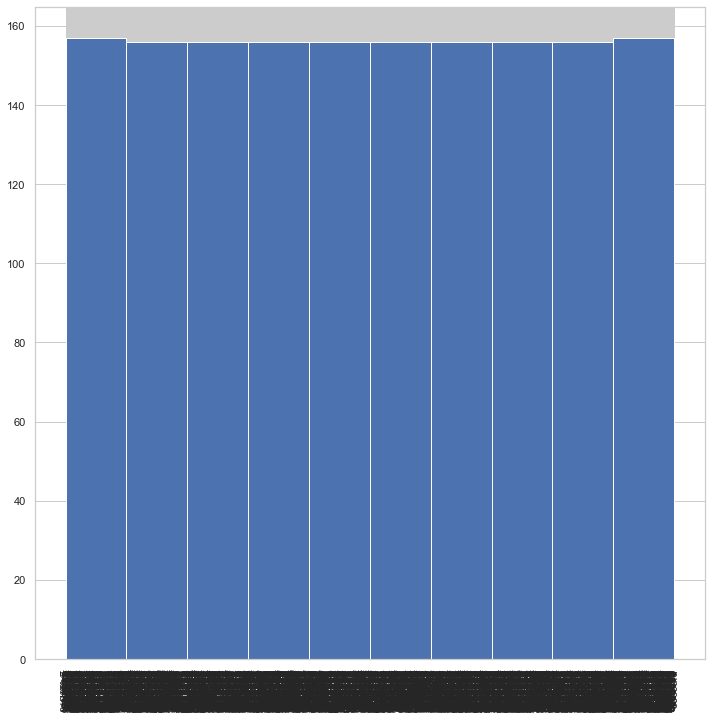

In [9]:
plt.figure(figsize=(12,12))
plt.hist(x=traincat['county_code'])
plt.xticks(rotation=90)
plt.show()

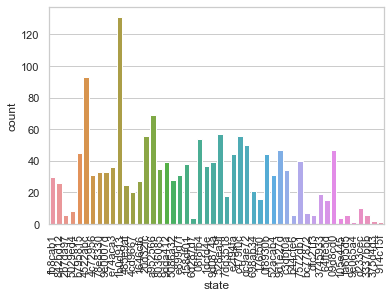

In [10]:
sns.countplot(x=traincat.state)
plt.xticks(rotation=90)
plt.show()

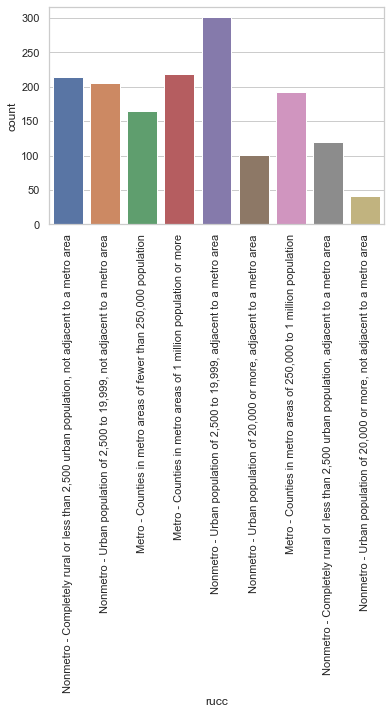

In [11]:
sns.countplot(x=traincat.rucc)
plt.xticks(rotation=90)
plt.show()

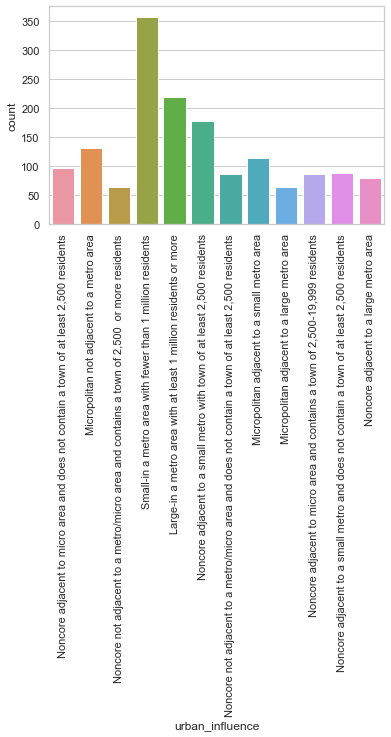

In [12]:
sns.countplot(x=traincat.urban_influence)
plt.xticks(rotation=90)
plt.show()

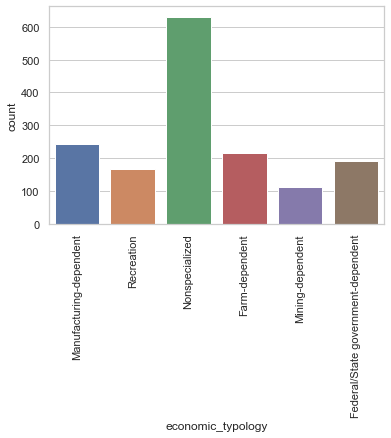

In [13]:
sns.countplot(x=traincat.economic_typology)
plt.xticks(rotation=90)
plt.show()

In [14]:
trainnum = train.drop(labels=['row_id','county_code','state','rucc','urban_influence','economic_typology'],axis=1)

In [15]:
trainnum.head()

,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,pct_nh_pi,pct_multiple,pct_other,poverty_rate,pct_civilian_labor,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k
0,3876.0,408.0,24.583,NaN,18.380,0.945945,0.010761,0.026038,0.005685,0.005635,0.0,0.005935,0.000000,4.172,0.550,0.023,0.107,0.062,0.310,0.166,0.100,NaN,0.262,0.342,11.022908,NaN,NaN,217,NaN,NaN,0.471,0.218,0.190,0.083250,0.327984,0.389168,0.199599,10.008982,9.752342
1,10224.0,1166.0,28.346,3.0,26.694,0.808959,0.002284,0.173426,0.001803,0.001493,0.0,0.012033,0.000000,7.714,0.545,0.040,0.324,0.201,0.253,0.102,0.066,0.070,0.200,0.148,9.904099,NaN,18.26,181,2009.0,1690.0,0.472,0.290,0.077,0.099099,0.202202,0.302302,0.396396,14.482893,3.013219
2,27023.0,2927.0,21.641,9.0,31.028,0.956621,0.005141,0.013088,0.004728,0.004708,0.0,0.014809,0.000905,9.789,0.508,0.063,0.129,0.032,0.296,0.215,0.087,0.070,0.187,0.258,11.011502,NaN,19.94,234,4650.0,1350.0,0.496,0.208,0.192,0.137725,0.387226,0.255489,0.219561,9.620346,10.873572
3,8735.0,1039.0,23.110,0.0,27.734,0.894835,0.000298,0.076576,0.000995,0.004297,0.0,0.022999,0.000000,13.735,0.545,0.038,0.207,0.084,0.255,0.182,0.104,0.081,0.169,0.274,12.845770,NaN,30.31,231,4420.0,1749.0,0.503,0.193,0.215,0.077154,0.308617,0.398798,0.215431,9.383225,10.870809
4,3681.0,365.0,21.985,2.0,19.673,0.923886,0.000496,0.042889,0.000000,0.013622,0.0,0.016905,0.002202,8.217,0.474,0.034,0.177,0.075,0.324,0.118,0.113,NaN,0.178,0.340,11.565750,NaN,NaN,270,NaN,1249.0,0.516,0.222,0.230,0.092537,0.362189,0.346269,0.199005,9.543286,14.723926


In [16]:
trainnum1 = trainnum[['population','renter_occupied_households','pct_renter_occupied','evictions','rent_burden']]

In [17]:
trainnum1.head()

,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden
0,3876.0,408.0,24.583,NaN,18.380
1,10224.0,1166.0,28.346,3.0,26.694
2,27023.0,2927.0,21.641,9.0,31.028
3,8735.0,1039.0,23.110,0.0,27.734
4,3681.0,365.0,21.985,2.0,19.673


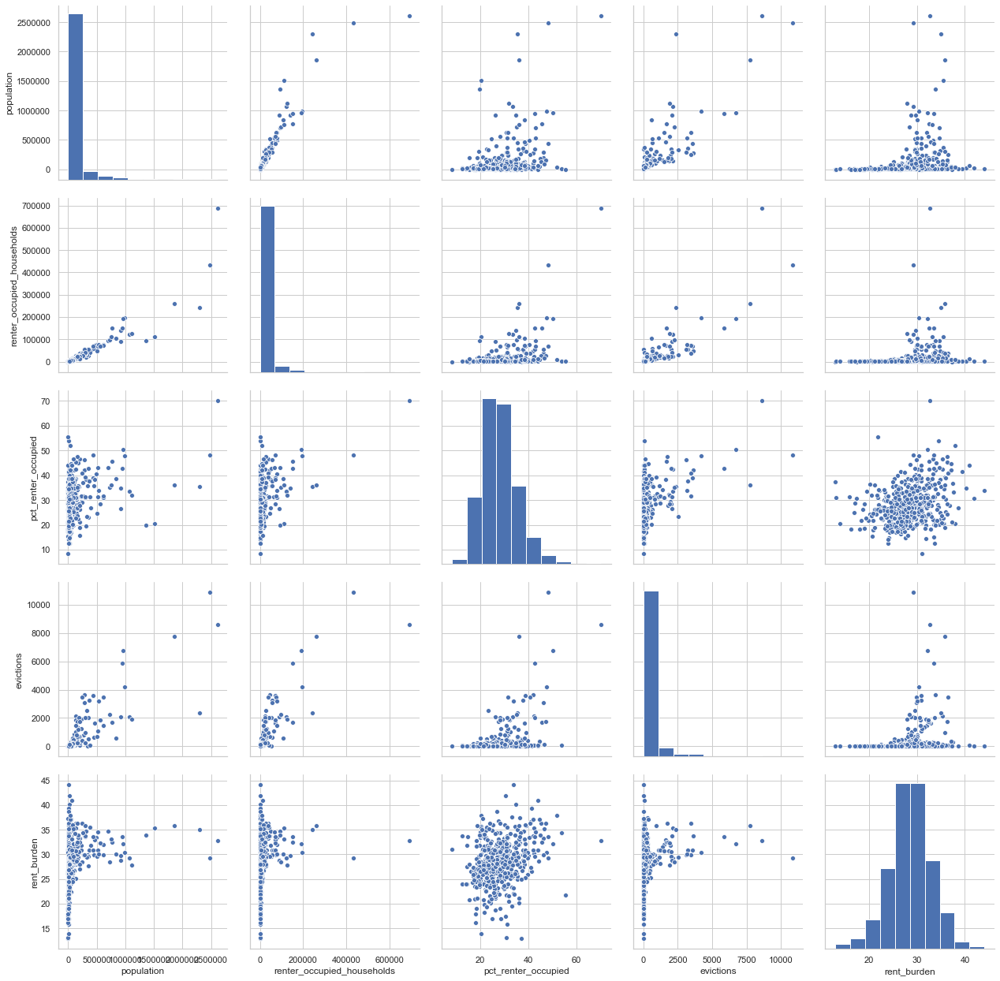

In [18]:
sns.pairplot(trainnum1.sample(500),height=3.5)
plt.show()

In [19]:
trainnum.isnull().sum()

population                                      0
renter_occupied_households                      0
pct_renter_occupied                             0
evictions                                     327
rent_burden                                     0
pct_white                                       0
pct_af_am                                       0
pct_hispanic                                    0
pct_am_ind                                      0
pct_asian                                       0
pct_nh_pi                                       0
pct_multiple                                    0
pct_other                                       0
poverty_rate                                    0
pct_civilian_labor                              0
pct_unemployment                                0
pct_uninsured_adults                            2
pct_uninsured_children                          2
pct_adult_obesity                               2
pct_adult_smoking                             218


### Load the test dataset

In [20]:
test = pd.read_csv('Xtestoriginal.csv')

In [21]:
test.head()

,row_id,county_code,state,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,pct_nh_pi,pct_multiple,pct_other,poverty_rate,rucc,urban_influence,economic_typology,pct_civilian_labor,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k
0,0,8e7613e,9d1e27d,52842.0,5403.0,26.840,NaN,27.960,0.924234,0.025049,0.034351,0.001978,0.002308,0.000000,0.012080,0.000000,11.469,Metro - Counties in metro areas of fewer than ...,Small-in a metro area with fewer than 1 millio...,Nonspecialized,0.436,0.075,0.218,0.057,0.284,0.257,0.114,0.080,0.048,0.332,13.194028,3.31,19.83,293,4880.0,2710.0,0.512,0.215,0.177,0.174651,0.395210,0.274451,0.155689,9.828291,10.628268
1,1,694a5e8,a952566,212287.0,53502.0,57.534,6032.0,33.072,0.398318,0.484635,0.063760,0.001394,0.021801,0.000199,0.028500,0.001394,19.170,Metro - Counties in metro areas of 1 million p...,Large-in a metro area with at least 1 million ...,Federal/State government-dependent,0.524,0.062,0.225,0.058,0.282,0.187,0.097,0.120,0.164,0.252,12.419433,26.93,10.83,308,850.0,1009.0,0.522,0.192,0.113,0.168327,0.230080,0.241036,0.360558,13.285546,8.818293
2,2,b3f0726,20d32fc,81263.0,13368.0,39.994,1012.0,32.044,0.483789,0.381916,0.099035,0.002509,0.009255,0.000800,0.018710,0.003988,17.408,"Nonmetro - Urban population of 20,000 or more,...",Micropolitan adjacent to a large metro area,Manufacturing-dependent,0.464,0.094,0.250,0.081,0.349,0.121,0.137,0.099,NaN,0.308,11.877446,10.26,23.25,269,2980.0,2459.0,0.526,0.240,0.153,0.201816,0.329970,0.287588,0.180626,11.571830,10.136089
3,3,fd922f0,1b0d913,122870.0,19359.0,41.865,NaN,30.724,0.468043,0.088393,0.368847,0.003210,0.046383,0.002206,0.021934,0.000984,18.560,"Metro - Counties in metro areas of 250,000 to ...",Small-in a metro area with fewer than 1 millio...,Nonspecialized,0.468,0.040,0.368,0.148,0.339,0.226,0.100,0.099,0.150,0.320,9.826327,8.25,21.27,340,2259.0,1240.0,0.491,0.282,0.111,0.239563,0.277336,0.333996,0.149105,17.191860,10.089273
4,4,3bd551e,698ab34,146153.0,15766.0,30.681,644.0,30.860,0.651511,0.251317,0.047687,0.005197,0.016952,0.000900,0.025737,0.000700,10.460,"Metro - Counties in metro areas of 250,000 to ...",Small-in a metro area with fewer than 1 millio...,Nonspecialized,0.470,0.058,0.211,0.084,0.290,0.191,0.104,0.090,0.153,0.246,12.530045,5.30,16.52,263,1919.0,2509.0,0.516,0.259,0.108,0.100100,0.289289,0.360360,0.250250,12.463880,6.432751


In [22]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1576 entries, 0 to 1575
Data columns (total 45 columns):
row_id                                        1576 non-null int64
county_code                                   1576 non-null object
state                                         1576 non-null object
population                                    1576 non-null float64
renter_occupied_households                    1576 non-null float64
pct_renter_occupied                           1576 non-null float64
evictions                                     1263 non-null float64
rent_burden                                   1576 non-null float64
pct_white                                     1576 non-null float64
pct_af_am                                     1576 non-null float64
pct_hispanic                                  1576 non-null float64
pct_am_ind                                    1576 non-null float64
pct_asian                                     1576 non-null float64
pct_nh_pi    

In [23]:
test.shape

(1576, 45)

In [24]:
test.describe()

,row_id,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,pct_nh_pi,pct_multiple,pct_other,poverty_rate,pct_civilian_labor,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k
count,1576.000000,1.576000e+03,1576.000000,1576.000000,1263.000000,1576.000000,1576.000000,1576.000000,1576.000000,1576.000000,1576.000000,1576.000000,1576.000000,1576.000000,1576.000000,1576.000000,1576.000000,1573.000000,1573.000000,1573.000000,1361.000000,1573.000000,1466.000000,1119.000000,1573.000000,1563.000000,637.000000,1399.000000,1576.000000,1470.000000,1485.000000,1573.000000,1573.000000,1573.000000,1576.000000,1576.000000,1576.000000,1576.000000,1576.000000,1576.000000
mean,787.500000,9.335925e+04,13026.646574,28.604343,330.127474,28.491293,0.777703,0.089202,0.084696,0.015787,0.012361,0.000833,0.018565,0.000852,12.223749,0.472693,0.062339,0.215020,0.085459,0.306643,0.213584,0.107628,0.083731,0.165150,0.279910,11.616655,5.794270,21.381094,278.209391,3517.072109,2619.026263,0.500537,0.228711,0.167240,0.145707,0.348718,0.302235,0.203340,11.750982,10.390796
std,455.096327,2.620079e+05,43974.207970,8.011919,1171.361516,4.464953,0.193223,0.144440,0.128088,0.064822,0.026029,0.004712,0.018096,0.001599,5.683836,0.074010,0.022760,0.064746,0.038708,0.041216,0.062011,0.022486,0.020926,0.051802,0.052768,1.527349,5.027517,10.104331,59.803588,2785.845176,2312.952925,0.020815,0.031792,0.041578,0.065339,0.070282,0.051146,0.088301,2.561985,2.792358
min,0.000000,1.170000e+02,15.000000,9.159000,-1.000000,10.011000,0.063466,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.237000,0.013000,0.039000,0.013000,0.131000,0.066000,0.036000,0.040000,0.042000,0.103000,6.965724,-0.340000,3.690000,78.000000,460.000000,190.000000,0.286000,0.102000,0.062000,0.015984,0.119522,0.141994,0.018924,3.929273,1.956947
25%,393.750000,1.194450e+04,1219.500000,23.242250,5.000000,26.076000,0.663229,0.005739,0.018686,0.001107,0.002405,0.000000,0.010148,0.000000,8.190750,0.425000,0.047000,0.167000,0.058000,0.284000,0.172000,0.092000,0.070000,0.129000,0.247000,10.447460,2.680000,14.050000,236.000000,1889.250000,1379.000000,0.496000,0.209000,0.140000,0.096952,0.305431,0.265265,0.141470,10.096672,8.533006
50%,787.500000,2.655800e+04,2840.500000,27.389000,33.000000,28.728500,0.845921,0.021105,0.037291,0.002546,0.005447,0.000000,0.015126,0.000300,11.520500,0.474000,0.060000,0.214000,0.076000,0.308000,0.209000,0.107000,0.080000,0.162000,0.282000,11.829378,4.600000,19.480000,272.000000,2699.000000,1949.000000,0.505000,0.228000,0.164000,0.131671,0.350851,0.302605,0.180542,11.600847,10.438959
75%,1181.250000,6.684575e+04,7778.750000,32.599250,172.000000,31.094750,0.933928,0.100009,0.087298,0.006097,0.012101,0.000501,0.021380,0.001109,15.192000,0.517000,0.075000,0.258000,0.104000,0.332000,0.249000,0.122000,0.091000,0.196000,0.315000,12.884036,7.490000,27.055000,317.000000,4086.750000,2839.000000,0.511000,0.246000,0.191000,0.187282,0.397257,0.337669,0.242387,13.087604,12.211512
max,1575.000000,5.235503e+06,870180.000000,80.718000,16728.000000,44.784000,0.997596,0.858727,0.936402,0.792703,0.334986,0.111187,0.235186,0.019161,44.132000,1.000000,0.230000,0.467000,0.283000,0.483000,0.474000,0.195000,0.171000,0.567000,0.452000,15.037129,51.490000,94.860000,545.000000,28129.000000,23399.000000,0.553000,0.406000,0.346000,0.484453,0.550201,0.458291,0.615538,27.856636,27.39726

In [25]:
testcat = test[['county_code','state','rucc','urban_influence','economic_typology']]

In [26]:
testcat.head()

,county_code,state,rucc,urban_influence,economic_typology
0,8e7613e,9d1e27d,Metro - Counties in metro areas of fewer than ...,Small-in a metro area with fewer than 1 millio...,Nonspecialized
1,694a5e8,a952566,Metro - Counties in metro areas of 1 million p...,Large-in a metro area with at least 1 million ...,Federal/State government-dependent
2,b3f0726,20d32fc,"Nonmetro - Urban population of 20,000 or more,...",Micropolitan adjacent to a large metro area,Manufacturing-dependent
3,fd922f0,1b0d913,"Metro - Counties in metro areas of 250,000 to ...",Small-in a metro area with fewer than 1 millio...,Nonspecialized
4,3bd551e,698ab34,"Metro - Counties in metro areas of 250,000 to ...",Small-in a metro area with fewer than 1 millio...,Nonspecialized


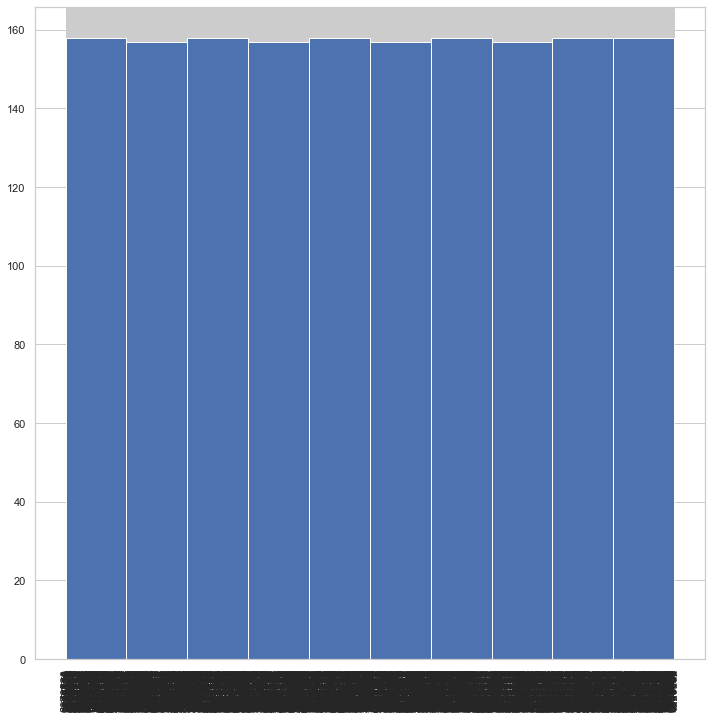

In [27]:
plt.figure(figsize=(12,12))
plt.hist(x=testcat['county_code'])
plt.xticks(rotation=90)
plt.show()

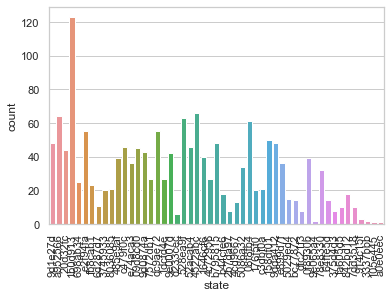

In [28]:
sns.countplot(x=testcat.state)
plt.xticks(rotation=90)
plt.show()

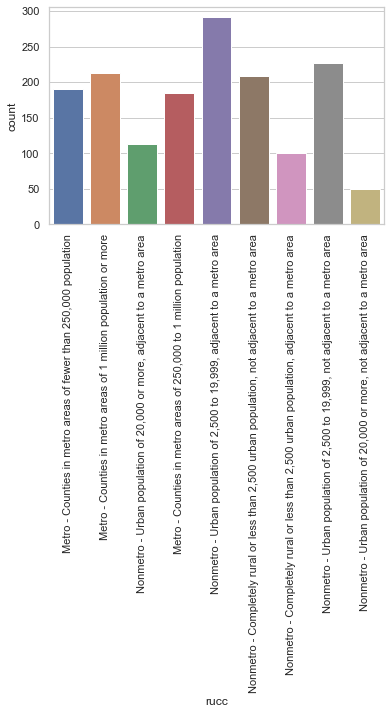

In [29]:
sns.countplot(x=testcat.rucc)
plt.xticks(rotation=90)
plt.show()

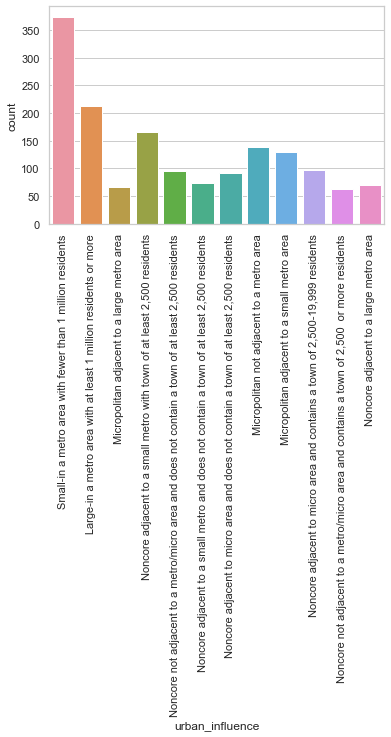

In [30]:
sns.countplot(x=testcat.urban_influence)
plt.xticks(rotation=90)
plt.show()

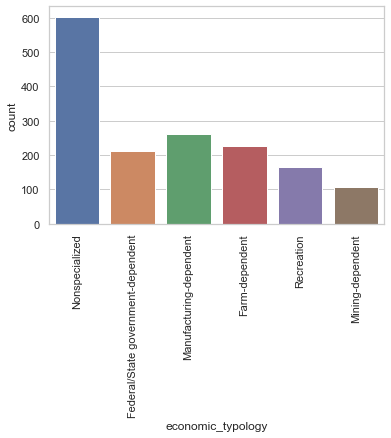

In [31]:
sns.countplot(x=testcat.economic_typology)
plt.xticks(rotation=90)
plt.show()

In [32]:
testnum = test.drop(labels=['row_id','county_code','state','rucc','urban_influence','economic_typology'],axis=1)

In [33]:
testnum.head()

,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,pct_nh_pi,pct_multiple,pct_other,poverty_rate,pct_civilian_labor,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k
0,52842.0,5403.0,26.840,NaN,27.960,0.924234,0.025049,0.034351,0.001978,0.002308,0.000000,0.012080,0.000000,11.469,0.436,0.075,0.218,0.057,0.284,0.257,0.114,0.080,0.048,0.332,13.194028,3.31,19.83,293,4880.0,2710.0,0.512,0.215,0.177,0.174651,0.395210,0.274451,0.155689,9.828291,10.628268
1,212287.0,53502.0,57.534,6032.0,33.072,0.398318,0.484635,0.063760,0.001394,0.021801,0.000199,0.028500,0.001394,19.170,0.524,0.062,0.225,0.058,0.282,0.187,0.097,0.120,0.164,0.252,12.419433,26.93,10.83,308,850.0,1009.0,0.522,0.192,0.113,0.168327,0.230080,0.241036,0.360558,13.285546,8.818293
2,81263.0,13368.0,39.994,1012.0,32.044,0.483789,0.381916,0.099035,0.002509,0.009255,0.000800,0.018710,0.003988,17.408,0.464,0.094,0.250,0.081,0.349,0.121,0.137,0.099,NaN,0.308,11.877446,10.26,23.25,269,2980.0,2459.0,0.526,0.240,0.153,0.201816,0.329970,0.287588,0.180626,11.571830,10.136089
3,122870.0,19359.0,41.865,NaN,30.724,0.468043,0.088393,0.368847,0.003210,0.046383,0.002206,0.021934,0.000984,18.560,0.468,0.040,0.368,0.148,0.339,0.226,0.100,0.099,0.150,0.320,9.826327,8.25,21.27,340,2259.0,1240.0,0.491,0.282,0.111,0.239563,0.277336,0.333996,0.149105,17.191860,10.089273
4,146153.0,15766.0,30.681,644.0,30.860,0.651511,0.251317,0.047687,0.005197,0.016952,0.000900,0.025737,0.000700,10.460,0.470,0.058,0.211,0.084,0.290,0.191,0.104,0.090,0.153,0.246,12.530045,5.30,16.52,263,1919.0,2509.0,0.516,0.259,0.108,0.100100,0.289289,0.360360,0.250250,12.463880,6.432751


In [34]:
testnum1 = testnum[['population','renter_occupied_households','pct_renter_occupied','evictions','rent_burden']]

In [35]:
testnum1.head()

,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden
0,52842.0,5403.0,26.840,NaN,27.960
1,212287.0,53502.0,57.534,6032.0,33.072
2,81263.0,13368.0,39.994,1012.0,32.044
3,122870.0,19359.0,41.865,NaN,30.724
4,146153.0,15766.0,30.681,644.0,30.860


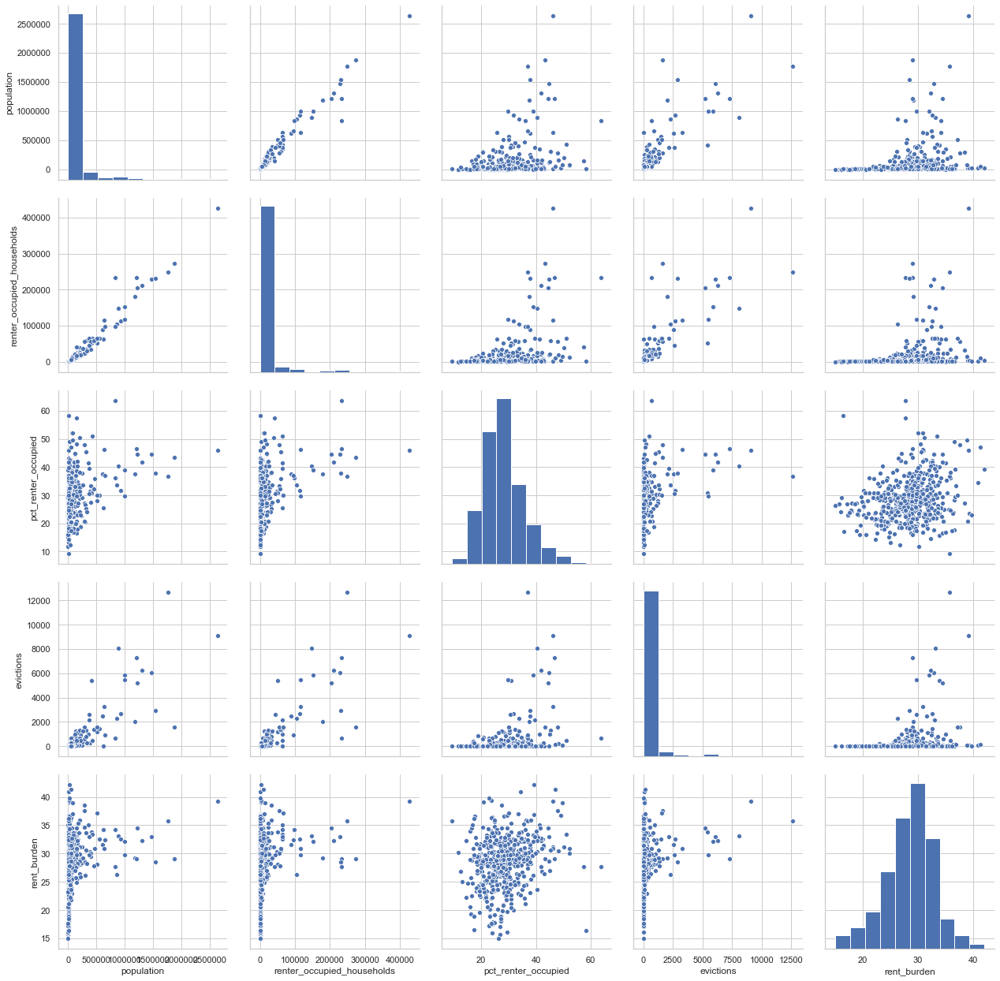

In [36]:
sns.pairplot(testnum1.sample(500),height=3.5)
plt.show()

In [37]:
testnum.isnull().sum()

population                                      0
renter_occupied_households                      0
pct_renter_occupied                             0
evictions                                     313
rent_burden                                     0
pct_white                                       0
pct_af_am                                       0
pct_hispanic                                    0
pct_am_ind                                      0
pct_asian                                       0
pct_nh_pi                                       0
pct_multiple                                    0
pct_other                                       0
poverty_rate                                    0
pct_civilian_labor                              0
pct_unemployment                                0
pct_uninsured_adults                            3
pct_uninsured_children                          3
pct_adult_obesity                               3
pct_adult_smoking                             215


### Explore the combined dataset

In [38]:
df = pd.read_csv('combined.csv')

In [39]:
df.head()

,county_code,state,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,pct_nh_pi,pct_multiple,pct_other,poverty_rate,rucc,urban_influence,economic_typology,pct_civilian_labor,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k,gross_rent
0,8e686a7,fb8cab1,3876,408,24.583,NaN,18.380,0.945945,0.010761,0.026038,0.005685,0.005635,0.0,0.005935,0.000000,4.172,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to micro area and does not co...,Manufacturing-dependent,0.550,0.023,0.107,0.062,0.310,0.166,0.100,NaN,0.262,0.342,11.022908,NaN,NaN,217,NaN,NaN,0.471,0.218,0.190,0.083250,0.327984,0.389168,0.199599,10.008982,9.752342,577
1,d1b5fc5,842bd12,10224,1166,28.346,3.0,26.694,0.808959,0.002284,0.173426,0.001803,0.001493,0.0,0.012033,0.000000,7.714,"Nonmetro - Completely rural or less than 2,500...",Micropolitan not adjacent to a metro area,Recreation,0.545,0.040,0.324,0.201,0.253,0.102,0.066,0.070,0.200,0.148,9.904099,NaN,18.26,181,2009.0,1690.0,0.472,0.290,0.077,0.099099,0.202202,0.302302,0.396396,14.482893,3.013219,844
2,19a463b,2b7da97,27023,2927,21.641,9.0,31.028,0.956621,0.005141,0.013088,0.004728,0.004708,0.0,0.014809,0.000905,9.789,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore not adjacent to a metro/micro area and...,Recreation,0.508,0.063,0.129,0.032,0.296,0.215,0.087,0.070,0.187,0.258,11.011502,NaN,19.94,234,4650.0,1350.0,0.496,0.208,0.192,0.137725,0.387226,0.255489,0.219561,9.620346,10.873572,700
3,1711ab7,5029ed4,8735,1039,23.110,0.0,27.734,0.894835,0.000298,0.076576,0.000995,0.004297,0.0,0.022999,0.000000,13.735,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore not adjacent to a metro/micro area and...,Nonspecialized,0.545,0.038,0.207,0.084,0.255,0.182,0.104,0.081,0.169,0.274,12.845770,NaN,30.31,231,4420.0,1749.0,0.503,0.193,0.215,0.077154,0.308617,0.398798,0.215431,9.383225,10.870809,592
4,1eb4681,b795815,3681,365,21.985,2.0,19.673,0.923886,0.000496,0.042889,0.000000,0.013622,0.0,0.016905,0.002202,8.217,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to micro area and does not co...,Farm-dependent,0.474,0.034,0.177,0.075,0.324,0.118,0.113,NaN,0.178,0.340,11.565750,NaN,NaN,270,NaN,1249.0,0.516,0.222,0.230,0.092537,0.362189,0.346269,0.199005,9.543286,14.723926,444


In [40]:
df.tail()

,county_code,state,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,pct_nh_pi,pct_multiple,pct_other,poverty_rate,rucc,urban_influence,economic_typology,pct_civilian_labor,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k,gross_rent
3133,dae1584,52acab4,44414,6275,35.026,254.0,30.569,0.726121,0.019125,0.054938,0.143854,0.005045,0.000301,0.050415,0.000201,13.606,"Nonmetro - Urban population of 2,500 to 19,999...",Micropolitan adjacent to a small metro area,Nonspecialized,0.401,0.048,0.300,0.131,0.333,0.259,0.117,0.08,0.091,0.297,10.200021,5.67,25.89,330,2779.0,2530.0,0.511,0.233,0.165,0.158683,0.332335,0.295409,0.213573,13.675599,11.802539,671
3134,b95e0ba,485e9af,16160,1871,31.922,NaN,33.899,0.663196,0.303469,0.015262,0.001817,0.001717,0.000000,0.004257,0.010282,20.052,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore adjacent to a small metro with town of...,Nonspecialized,0.450,0.059,0.254,0.062,0.355,0.195,0.111,0.10,NaN,0.333,10.897362,NaN,30.34,347,8620.0,8160.0,0.495,0.227,0.176,0.210159,0.419323,0.240040,0.130478,10.286142,13.278474,612
3135,f44348c,1dcfd4e,28688,4478,33.897,NaN,28.644,0.809853,0.011596,0.147624,0.001816,0.009389,0.003832,0.005427,0.010463,6.418,"Nonmetro - Urban population of 20,000 or more,...",Micropolitan not adjacent to a metro area,Recreation,0.696,0.034,0.231,0.132,0.144,0.096,0.039,0.11,0.331,0.117,12.726635,NaN,10.74,78,1229.0,959.0,0.451,0.170,0.094,0.051793,0.173307,0.288845,0.486056,9.229493,2.385150,1007
3136,c9450a6,52acab4,29234,4528,40.479,57.0,24.803,0.707838,0.030869,0.160475,0.025157,0.014104,0.000700,0.060857,0.000000,12.429,"Nonmetro - Urban population of 2,500 to 19,999...",Micropolitan not adjacent to a metro area,Mining-dependent,0.532,0.031,0.286,0.133,0.287,0.161,0.108,0.08,0.107,0.335,9.967003,NaN,18.86,349,2139.0,1849.0,0.501,0.237,0.131,0.137412,0.350050,0.243731,0.268806,16.695002,9.758586,713
3137,c229ad2,78e8330,4036,327,18.052,NaN,22.122,0.967377,0.001192,0.012517,0.013282,0.003944,0.000000,0.001689,0.000000,6.621,"Nonmetro - Completely rural or less than 2,500...",Micropolitan not adjacent to a metro area,Farm-dependent,0.562,0.025,0.158,0.074,0.358,0.130,0.089,NaN,0.202,0.295,9.667330,NaN,NaN,260,NaN,NaN,0.489,0.236,0.217,0.110000,0.338000,0.311000,0.241000,10.982154,7.487832,593


In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3138 entries, 0 to 3137
Data columns (total 45 columns):
county_code                                   3138 non-null object
state                                         3138 non-null object
population                                    3138 non-null int64
renter_occupied_households                    3138 non-null int64
pct_renter_occupied                           3138 non-null float64
evictions                                     2498 non-null float64
rent_burden                                   3138 non-null float64
pct_white                                     3138 non-null float64
pct_af_am                                     3138 non-null float64
pct_hispanic                                  3138 non-null float64
pct_am_ind                                    3138 non-null float64
pct_asian                                     3138 non-null float64
pct_nh_pi                                     3138 non-null float64
pct_multiple   

In [42]:
df.describe(include='all')

,county_code,state,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,pct_nh_pi,pct_multiple,pct_other,poverty_rate,rucc,urban_influence,economic_typology,pct_civilian_labor,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k,gross_rent
count,3138,3138,3.138000e+03,3.138000e+03,3138.000000,2498.000000,3138.000000,3138.000000,3138.000000,3138.000000,3138.000000,3138.000000,3138.000000,3138.000000,3138.000000,3138.000000,3138,3138,3138,3138.000000,3138.000000,3133.000000,3133.000000,3133.000000,2705.000000,3133.000000,2912.000000,2219.000000,3133.000000,3105.000000,1250.000000,2771.000000,3138.000000,2917.000000,2933.000000,3133.000000,3133.000000,3133.000000,3138.000000,3138.000000,3138.000000,3138.000000,3138.000000,3138.000000,3138.000000
unique,3138,51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,12,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,3ecb3cd,1b0d913,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Nonmetro - Urban population of 2,500 to 19,999...",Small-in a metro area with fewer than 1 millio...,Nonspecialized,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,254,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,592,732,1234,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,1.008165e+05,1.396144e+04,28.565132,363.391914,28.514306,0.773394,0.088899,0.088337,0.017103,0.012534,0.000773,0.018076,0.000884,12.203356,NaN,NaN,NaN,0.471619,0.062445,0.217518,0.087144,0.305599,0.212639,0.107099,0.083530,0.164986,0.278452,11.626925,5.773744,21.546496,276.852135,3469.825848,2564.363450,0.499965,0.228692,0.167473,0.145687,0.347500,0.302631,0.204183,11.686458,10.402913,700.496176
std,NaN,NaN,3.229873e+05,5.403000e+04,8.065512,1356.683376,4.567738,0.198322,0.143953,0.135010,0.069948,0.026358,0.003976,0.017013,0.001628,5.732980,NaN,NaN,NaN,0.072493,0.022685,0.066169,0.040142,0.042400,0.063025,0.022506,0.021079,0.051633,0.052944,1.530516,4.682077,10.413872,58.834698,2666.067220,2146.460781,0.022426,0.033283,0.043080,0.066404,0.070716,0.051685,0.090151,2.660699,2.781861,175.806214
min,NaN,NaN,1.170000e+02,1.500000e+01,7.279000,-1.000000,9.909000,0.009547,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,0.186000,0.012000,0.039000,0.013000,0.131000,0.031000,0.033000,0.030000,0.032000,0.103000,6.965724,-0.340000,3.140000,76.000000,340.000000,190.000000,0.286000,0.082000,0.036000,0.015984,0.074297,0.114458,0.018924,3.654080,0.961076,351.000000
25%,NaN,NaN,1.106575e+04,1.142750e+03,23.107000,4.000000,25.955250,0.657212,0.005606,0.018718,0.001189,0.002402,0.000000,0.009741,0.000000,8.063250,NaN,NaN,NaN,0.425000,0.046000,0.169000,0.058000,0.284000,0.170000,0.092000,0.070000,0.129000,0.245000,10.440005,2.682500,14.050000,234.000000,1870.000000,1379.000000,0.496000,0.209000,0.140000,0.095522,0.303326,0.266733,0.141752,10.063759,8.561913,586.000000
50%,NaN,NaN,2.587950e+04,2.812000e+03,27.289500,30.000000,28.745000,0.846237,0.020915,0.037449,0.002596,0.005386,0.000000,0.014736,0.000301,11.335000,NaN,NaN,NaN,0.472000,0.060000,0.215000,0.077000,0.307000,0.208000,0.106000,0.080000,0.163000,0.281000,11.889621,4.575000,19.910000,271.000000,2719.000000,1960.000000,0.504000,0.228000,0.1640

In [43]:
df.shape

(3138, 45)

In [44]:
df_numeric = df.drop(['county_code','state','rucc','urban_influence','economic_typology'],axis=1)

In [45]:
df_numeric.head()

,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,pct_nh_pi,pct_multiple,pct_other,poverty_rate,pct_civilian_labor,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k,gross_rent
0,3876,408,24.583,NaN,18.380,0.945945,0.010761,0.026038,0.005685,0.005635,0.0,0.005935,0.000000,4.172,0.550,0.023,0.107,0.062,0.310,0.166,0.100,NaN,0.262,0.342,11.022908,NaN,NaN,217,NaN,NaN,0.471,0.218,0.190,0.083250,0.327984,0.389168,0.199599,10.008982,9.752342,577
1,10224,1166,28.346,3.0,26.694,0.808959,0.002284,0.173426,0.001803,0.001493,0.0,0.012033,0.000000,7.714,0.545,0.040,0.324,0.201,0.253,0.102,0.066,0.070,0.200,0.148,9.904099,NaN,18.26,181,2009.0,1690.0,0.472,0.290,0.077,0.099099,0.202202,0.302302,0.396396,14.482893,3.013219,844
2,27023,2927,21.641,9.0,31.028,0.956621,0.005141,0.013088,0.004728,0.004708,0.0,0.014809,0.000905,9.789,0.508,0.063,0.129,0.032,0.296,0.215,0.087,0.070,0.187,0.258,11.011502,NaN,19.94,234,4650.0,1350.0,0.496,0.208,0.192,0.137725,0.387226,0.255489,0.219561,9.620346,10.873572,700
3,8735,1039,23.110,0.0,27.734,0.894835,0.000298,0.076576,0.000995,0.004297,0.0,0.022999,0.000000,13.735,0.545,0.038,0.207,0.084,0.255,0.182,0.104,0.081,0.169,0.274,12.845770,NaN,30.31,231,4420.0,1749.0,0.503,0.193,0.215,0.077154,0.308617,0.398798,0.215431,9.383225,10.870809,592
4,3681,365,21.985,2.0,19.673,0.923886,0.000496,0.042889,0.000000,0.013622,0.0,0.016905,0.002202,8.217,0.474,0.034,0.177,0.075,0.324,0.118,0.113,NaN,0.178,0.340,11.565750,NaN,NaN,270,NaN,1249.0,0.516,0.222,0.230,0.092537,0.362189,0.346269,0.199005,9.543286,14.723926,444


In [46]:
df_numeric.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3138 entries, 0 to 3137
Data columns (total 40 columns):
population                                    3138 non-null int64
renter_occupied_households                    3138 non-null int64
pct_renter_occupied                           3138 non-null float64
evictions                                     2498 non-null float64
rent_burden                                   3138 non-null float64
pct_white                                     3138 non-null float64
pct_af_am                                     3138 non-null float64
pct_hispanic                                  3138 non-null float64
pct_am_ind                                    3138 non-null float64
pct_asian                                     3138 non-null float64
pct_nh_pi                                     3138 non-null float64
pct_multiple                                  3138 non-null float64
pct_other                                     3138 non-null float64
poverty_rate 

In [47]:
df_numeric.shape

(3138, 40)

In [48]:
df_numeric.corr(method='pearson')

,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,pct_nh_pi,pct_multiple,pct_other,poverty_rate,pct_civilian_labor,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k,gross_rent
population,1.000000,0.973266,0.297320,0.796935,0.163907,-0.236702,0.072972,0.192519,-0.047312,0.452299,0.062985,0.072281,0.217408,-0.038471,0.078912,0.002970,-0.027577,-0.072823,-0.226086,-0.195165,-0.172477,-0.027202,0.011047,-0.245524,-0.086152,-0.001723,-0.282472,-0.137853,-0.172284,-0.139034,0.110420,0.059532,-0.218346,-0.052977,-0.312131,-0.067334,0.322464,0.093563,-0.253762,0.433501
renter_occupied_households,0.973266,1.000000,0.343515,0.791052,0.148734,-0.236209,0.084635,0.180836,-0.041047,0.432073,0.057249,0.067379,0.218413,-0.007211,0.072663,0.008286,-0.010980,-0.061625,-0.211780,-0.172776,-0.153699,-0.008703,0.011016,-0.215419,-0.084781,0.045981,-0.252561,-0.117580,-0.156887,-0.127614,0.103980,0.028122,-0.197539,-0.031605,-0.288415,-0.079587,0.295143,0.094650,-0.225410,0.386692
pct_renter_occupied,0.297320,0.343515,1.000000,0.355418,0.250781,-0.477562,0.291004,0.217850,0.128608,0.381728,0.138242,0.201120,0.233029,0.302571,-0.007844,0.105164,0.172986,-0.004499,-0.056685,-0.083177,-0.126409,0.158554,-0.068607,-0.152949,-0.084844,0.274012,-0.216613,0.047010,-0.248697,-0.237505,0.067266,0.106656,-0.460681,0.100682,-0.386551,-0.079250,0.274489,0.351199,-0.301519,0.310158
evictions,0.796935,0.791052,0.355418,1.000000,0.156386,-0.272391,0.180910,0.137999,-0.040439,0.345519,0.027919,0.080226,0.200828,0.024586,0.073831,0.013765,0.022504,-0.052876,-0.117961,-0.131643,-0.107285,0.058130,-0.001838,-0.167846,-0.018956,0.172840,-0.265117,-0.076941,-0.167774,-0.134355,0.129475,0.079602,-0.250303,-0.047179,-0.281849,-0.036368,0.285167,0.155443,-0.231731,0.340494
rent_burden,0.163907,0.148734,0.250781,0.156386,1.000000,-0.216680,0.361252,-0.015938,-0.157882,0.127816,0.016330,0.027646,0.159886,0.369610,-0.357669,0.427945,0.061620,-0.218131,0.016794,0.074294,0.165152,0.289692,-0.222272,-0.097628,0.099944,0.226326,-0.174158,0.153842,-0.017275,-0.021534,0.166217,-0.182943,-0.134672,0.158171,-0.123010,-0.193287,0.090798,-0.117450,-0.046280,0.222188
pct_white,-0.236702,-0.236209,-0.477562,-0.272391,-0.216680,1.000000,-0.607926,-0.601023,-0.279120,-0.275676,-0.129957,-0.122788,-0.165133,-0.497731,0.262246,-0.309373,-0.528659,-0.300429,-0.130393,0.046232,-0.156373,-0.455222,0.144992,0.014832,0.217635,-0.568194,-0.104680,-0.140627,-0.037026,-0.021571,0.047264,-0.340805,0.409829,-0.499901,0.316731,0.188214,0.011867,-0.391097,0.259069,-0.229232
pct_af_am,0.072972,0.084635,0.291004,0.180910,0.361252,-0.607926,1.000000,-0.110412,-0.101442,0.014607,-0.050812,-0.103170,0.114685,0.503181,-0.350896,0.397471,0.206177,-0.083565,0.411078,0.044429,0.499056,0.715359,-0.280233,0.254327,0.169591,0.697197,0.123469,0.376951,0.140897,0.113417,0.115050,0.032468,-0.215835,0.359069,-0.021394,-0.260061,-0.098608,0.069025,0.015499,0.002186
pct_hispanic,0.192519,0.180836,0.217850,0.137999,-0.015938,-0.601023,-0.110412,1.000000,-0.039532,0.140233,0.036521,-0.065435,0.071749,0.122137,0.013777,-0.037129,0.477976,0.458550,-0.244449,-0.201054,-0.255140,-0.021141,-0.015095,-0.230955,-0.398536,-0.036276,-0.054073,-0.144917,0.000312,-0.033833,-0.145291,0.317931,-0.219314,0.404513,-0.339769,-0.066699,0.006799,0.307697,-0.271613,0.188959
pct_am_ind,-0.047312,-0.041047,0.128608,-0.040439,-0

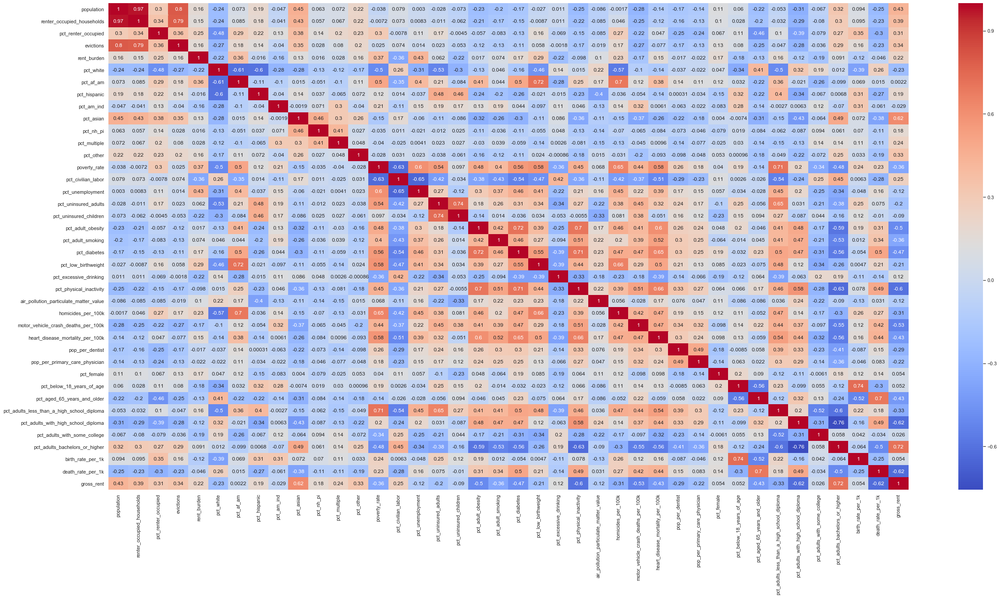

In [49]:
plt.figure(figsize=(40,20))
plt.yticks(rotation=0)
sns.heatmap(df_numeric.corr(method='pearson'),annot=True,cmap='coolwarm')
plt.show()

In [50]:
df_numeric.corr(method='kendall')

,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,pct_nh_pi,pct_multiple,pct_other,poverty_rate,pct_civilian_labor,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k,gross_rent
population,1.000000,0.903869,0.234783,0.716073,0.298075,-0.175179,0.289476,0.186572,-0.021503,0.476825,0.265333,0.226763,0.407648,-0.024796,0.037175,0.079500,-0.122672,-0.239865,-0.106121,-0.114397,-0.110703,-0.021483,-0.046405,-0.220499,0.061973,-0.281202,-0.462733,-0.063130,-0.272423,-0.223310,0.205911,0.097608,-0.366742,-0.091737,-0.247590,-0.034261,0.282494,0.106500,-0.299473,0.499780
renter_occupied_households,0.903869,1.000000,0.316221,0.722557,0.316048,-0.198969,0.300659,0.198699,-0.013841,0.492504,0.274331,0.241417,0.411340,0.005037,0.031590,0.089218,-0.103277,-0.237398,-0.105561,-0.111306,-0.110130,-0.002528,-0.052086,-0.215737,0.056985,-0.237788,-0.459573,-0.050432,-0.303606,-0.258568,0.224596,0.088401,-0.367600,-0.081793,-0.266526,-0.038692,0.290742,0.125611,-0.284617,0.486396
pct_renter_occupied,0.234783,0.316221,1.000000,0.268809,0.186339,-0.341291,0.217917,0.229138,0.056004,0.285176,0.198172,0.185548,0.209765,0.209494,-0.033498,0.059584,0.139154,0.011957,-0.023520,-0.049455,-0.068947,0.104428,-0.061537,-0.072684,-0.047850,0.138911,-0.159741,0.032555,-0.233149,-0.222227,0.126009,0.098010,-0.308670,0.077249,-0.247075,-0.043573,0.141222,0.248746,-0.171993,0.193257
evictions,0.716073,0.722557,0.268809,1.000000,0.285439,-0.175591,0.318178,0.120006,0.001100,0.432897,0.222649,0.249591,0.378516,0.007077,0.017903,0.103551,-0.121188,-0.242215,-0.024152,-0.049439,-0.043016,0.038882,-0.048370,-0.145016,0.083062,-0.083854,-0.404401,-0.024296,-0.255793,-0.207477,0.244991,0.069529,-0.318855,-0.068867,-0.199385,-0.028522,0.251449,0.115378,-0.224361,0.427359
rent_burden,0.298075,0.316048,0.186339,0.285439,1.000000,-0.184382,0.291886,0.025100,-0.060144,0.175228,0.092040,0.095052,0.207472,0.261163,-0.234625,0.340208,0.074727,-0.098015,0.010776,0.054780,0.114390,0.193361,-0.132668,-0.070065,0.062606,0.140141,-0.116530,0.087933,-0.056276,-0.062913,0.176871,-0.108896,-0.113545,0.122368,-0.093529,-0.131201,0.036308,-0.066790,-0.033616,0.179908
pct_white,-0.175179,-0.198969,-0.341291,-0.175591,-0.184382,1.000000,-0.473407,-0.476809,-0.062897,-0.218738,-0.154600,-0.136980,-0.207804,-0.270417,0.180909,-0.137357,-0.335604,-0.206126,-0.037602,0.051069,-0.065626,-0.282426,0.135329,0.044873,0.141146,-0.396606,-0.007851,-0.075572,0.050923,0.015129,-0.083153,-0.208115,0.319371,-0.281632,0.273873,0.084373,-0.026102,-0.235482,0.199739,-0.220162
pct_af_am,0.289476,0.300659,0.217917,0.318178,0.291886,-0.473407,1.000000,0.086324,-0.144706,0.177980,0.049838,0.051732,0.241601,0.263982,-0.241643,0.249297,0.123835,-0.077360,0.179022,0.077340,0.251661,0.422051,-0.208350,0.104599,0.115168,0.418364,-0.029176,0.244337,0.038835,0.031937,0.223053,0.046827,-0.253329,0.248154,-0.069070,-0.210306,-0.024219,0.074924,-0.066931,0.152910
pct_hispanic,0.186572,0.198699,0.229138,0.120006,0.025100,-0.476809,0.086324,1.000000,0.092531,0.249650,0.211773,0.114605,0.188124,-0.014877,0.063333,-0.131376,0.213137,0.257066,-0.208481,-0.177071,-0.211561,-0.044891,-0.022660,-0.246074,-0.229118,-0.060954,-0.118591,-0.143725,-0.136303,-0.078352,-0.061641,0.197492,-0.221596,0.068439,-0.345702,0.086987,0.156135,0.195911,-0.260251,0.306826
pct_am_ind,-0.021503,-0.013841,0.056004,0.001100,-0.060144

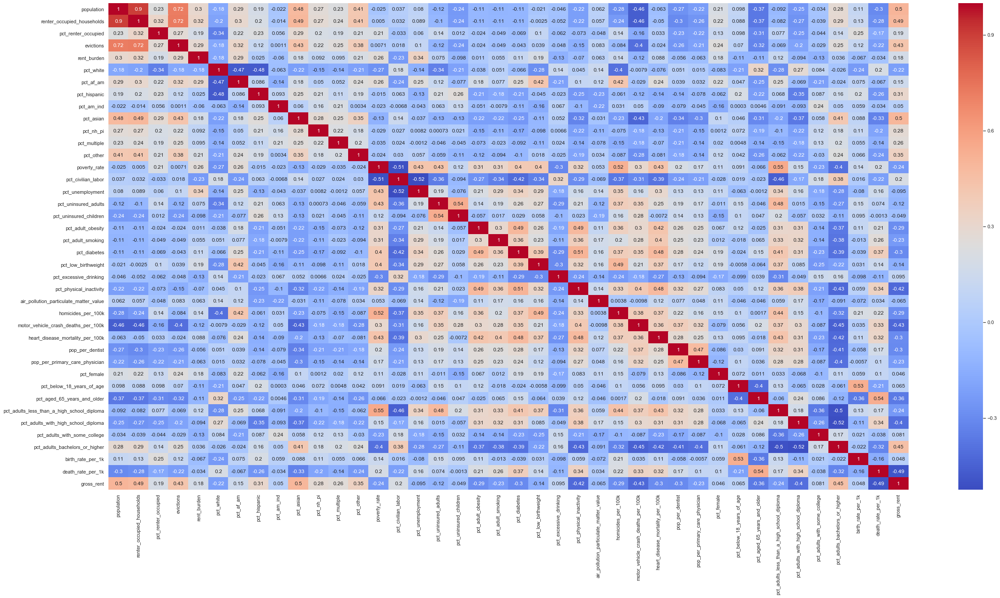

In [51]:
plt.figure(figsize=(40,20))
plt.yticks(rotation=0)
sns.heatmap(df_numeric.corr(method='kendall'),annot=True,cmap='coolwarm')
plt.show()

In [52]:
df_numeric.corr(method='spearman')

,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,pct_nh_pi,pct_multiple,pct_other,poverty_rate,pct_civilian_labor,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k,gross_rent
population,1.000000,0.986468,0.340469,0.882112,0.425022,-0.247911,0.416576,0.263538,-0.034416,0.643338,0.365972,0.320552,0.546002,-0.030052,0.036158,0.133105,-0.181275,-0.347944,-0.159699,-0.156388,-0.163270,-0.030505,-0.079358,-0.331237,0.092722,-0.385371,-0.648452,-0.088950,-0.388946,-0.321311,0.302036,0.143148,-0.510878,-0.126551,-0.364170,-0.058093,0.414698,0.155038,-0.418640,0.676480
renter_occupied_households,0.986468,1.000000,0.451914,0.886689,0.448454,-0.282565,0.431569,0.281604,-0.023492,0.663271,0.377667,0.340897,0.551501,0.012803,0.029137,0.145186,-0.153118,-0.345159,-0.159706,-0.152984,-0.164616,-0.003221,-0.088164,-0.324878,0.085361,-0.330779,-0.645804,-0.072313,-0.430359,-0.369075,0.328821,0.129338,-0.513575,-0.114222,-0.390935,-0.063401,0.427224,0.182640,-0.401458,0.665066
pct_renter_occupied,0.340469,0.451914,1.000000,0.387572,0.271180,-0.492657,0.319466,0.338511,0.083341,0.408001,0.271380,0.274501,0.293099,0.306919,-0.050432,0.088469,0.208802,0.018556,-0.037566,-0.071363,-0.104023,0.150056,-0.094025,-0.111140,-0.071676,0.204655,-0.238644,0.046889,-0.342411,-0.325185,0.180162,0.141399,-0.437821,0.114669,-0.359809,-0.064562,0.208447,0.360600,-0.251316,0.280119
evictions,0.882112,0.886689,0.387572,1.000000,0.403661,-0.245047,0.441265,0.165003,0.000113,0.597548,0.305862,0.356575,0.504516,0.010523,0.015581,0.156722,-0.179095,-0.351759,-0.037517,-0.066170,-0.062208,0.050857,-0.078109,-0.218562,0.123050,-0.115842,-0.575999,-0.033960,-0.369531,-0.300447,0.351411,0.101156,-0.445853,-0.096988,-0.296108,-0.043510,0.369786,0.164350,-0.321092,0.597714
rent_burden,0.425022,0.448454,0.271180,0.403661,1.000000,-0.266228,0.416692,0.036064,-0.089754,0.252419,0.126955,0.136776,0.285107,0.376523,-0.340505,0.478668,0.109566,-0.149228,0.014995,0.081752,0.165516,0.272377,-0.199493,-0.102057,0.098381,0.207341,-0.170519,0.129397,-0.081976,-0.093434,0.251891,-0.159809,-0.163742,0.180240,-0.142099,-0.194716,0.056586,-0.098374,-0.049281,0.261053
pct_white,-0.247911,-0.282565,-0.492657,-0.245047,-0.266228,1.000000,-0.616409,-0.615722,-0.088553,-0.303144,-0.211317,-0.183973,-0.284346,-0.385354,0.261185,-0.195939,-0.494191,-0.310140,-0.059655,0.075446,-0.093970,-0.391524,0.199373,0.064323,0.209932,-0.558212,-0.017867,-0.113304,0.068701,0.022031,-0.117538,-0.306135,0.467232,-0.404043,0.400364,0.122188,-0.027567,-0.344579,0.294463,-0.312732
pct_af_am,0.416576,0.431569,0.319466,0.441265,0.416692,-0.616409,1.000000,0.134513,-0.210671,0.254507,0.072425,0.074531,0.326520,0.374328,-0.346462,0.347156,0.187671,-0.114835,0.261730,0.117670,0.361850,0.561532,-0.306609,0.154983,0.185963,0.572922,-0.037240,0.357492,0.061150,0.048037,0.314082,0.069080,-0.368774,0.361829,-0.105912,-0.310789,-0.040988,0.108572,-0.100460,0.224087
pct_hispanic,0.263538,0.281604,0.338511,0.165003,0.036064,-0.615722,0.134513,1.000000,0.136481,0.356820,0.287050,0.167083,0.261088,-0.025722,0.094310,-0.190504,0.318486,0.380354,-0.311190,-0.259463,-0.312712,-0.066200,-0.033251,-0.363366,-0.337285,-0.092451,-0.173800,-0.213776,-0.201249,-0.118672,-0.090820,0.286618,-0.325187,0.096274,-0.504455,0.128071,0.229789,0.285950,-0.380826,0.444520
pct_am_ind,-0.034416,-0.023492,0.083341,0.000113,-0.089754

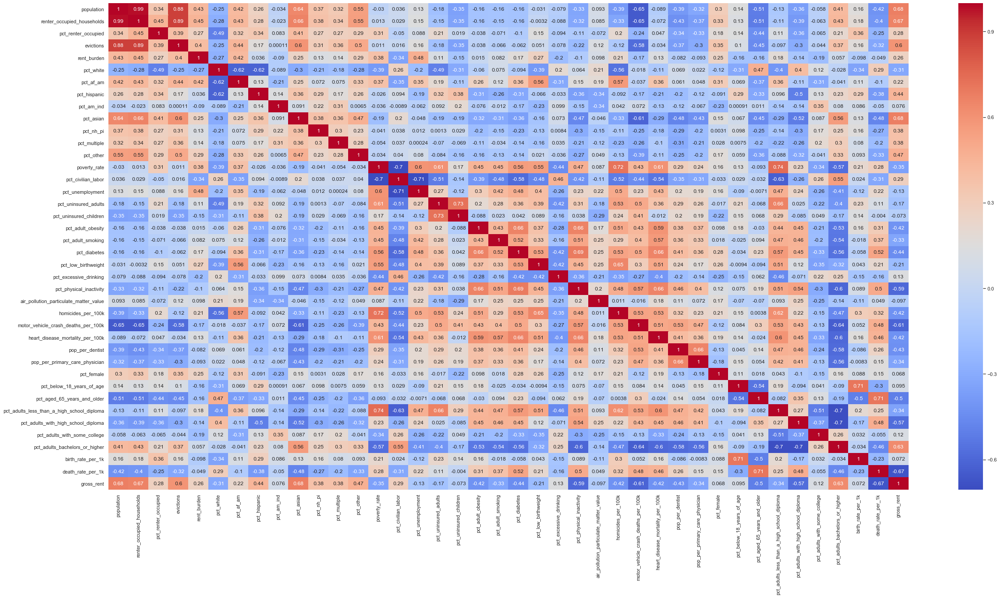

In [53]:
plt.figure(figsize=(40,20))
plt.yticks(rotation=0)
sns.heatmap(df_numeric.corr(method='spearman'),annot=True,cmap='coolwarm')
plt.show()

### Explore Numeric features using pairplot

In [54]:
df_numeric_1 = df[['population','renter_occupied_households','pct_renter_occupied','evictions','rent_burden','gross_rent']]

In [55]:
df_numeric_1

,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,gross_rent
0,3876,408,24.583,NaN,18.380,577
1,10224,1166,28.346,3.0,26.694,844
2,27023,2927,21.641,9.0,31.028,700
3,8735,1039,23.110,0.0,27.734,592
4,3681,365,21.985,2.0,19.673,444
5,8540,751,22.543,0.0,34.937,531
6,22712,1901,24.602,19.0,29.242,976
7,27974,3873,38.012,49.0,29.966,725
8,2027,295,55.572,NaN,21.808,533
9,17165,2223,29.769,NaN,28.664,531


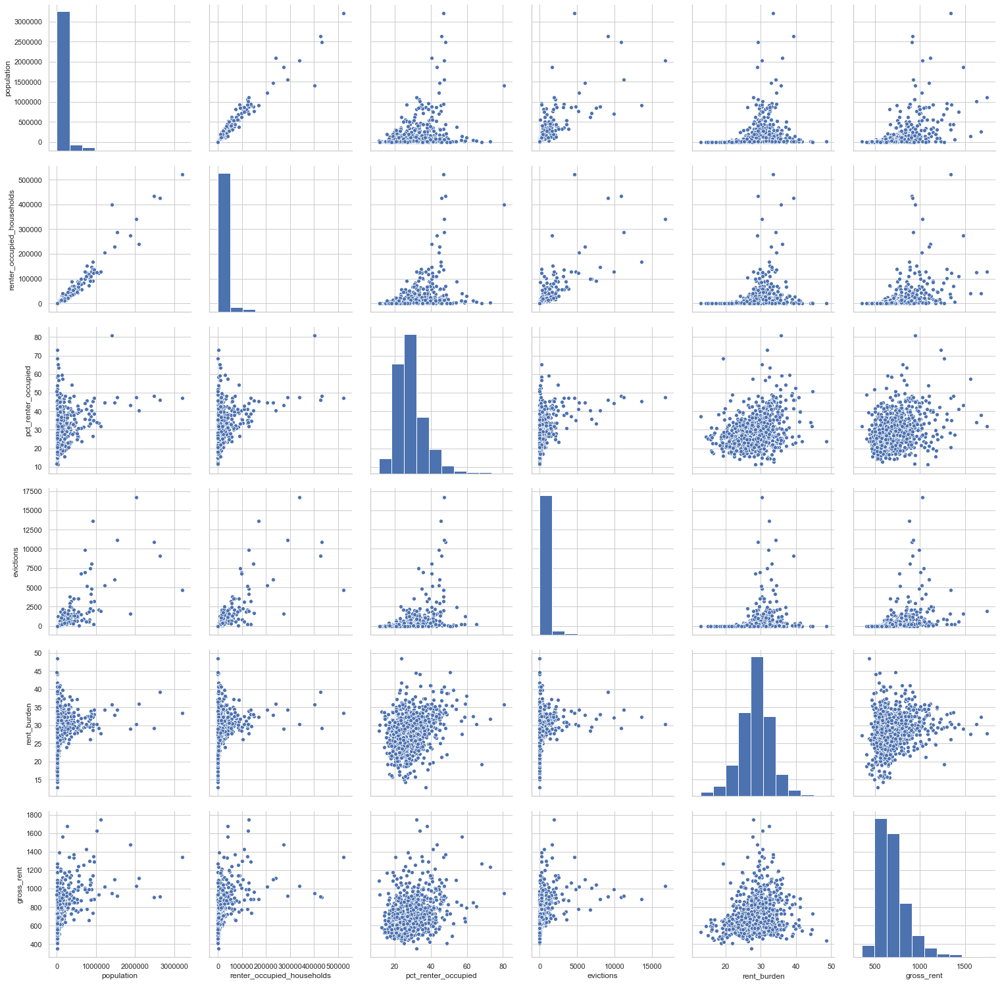

In [56]:
sns.pairplot(df_numeric_1.sample(1000),height=3.5)
plt.show()

In [57]:
df_numeric_2 = df[['pct_white','pct_af_am','pct_hispanic','pct_am_ind','pct_asian','gross_rent']]

In [58]:
df_numeric_2

,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,gross_rent
0,0.945945,0.010761,0.026038,0.005685,0.005635,577
1,0.808959,0.002284,0.173426,0.001803,0.001493,844
2,0.956621,0.005141,0.013088,0.004728,0.004708,700
3,0.894835,0.000298,0.076576,0.000995,0.004297,592
4,0.923886,0.000496,0.042889,0.000000,0.013622,444
5,0.560637,0.417547,0.000597,0.001294,0.000000,531
6,0.929799,0.005564,0.039416,0.002389,0.005106,976
7,0.537084,0.008489,0.396900,0.017048,0.024534,725
8,0.184899,0.001981,0.010408,0.749382,0.000000,533
9,0.961332,0.009077,0.011856,0.002779,0.000800,531


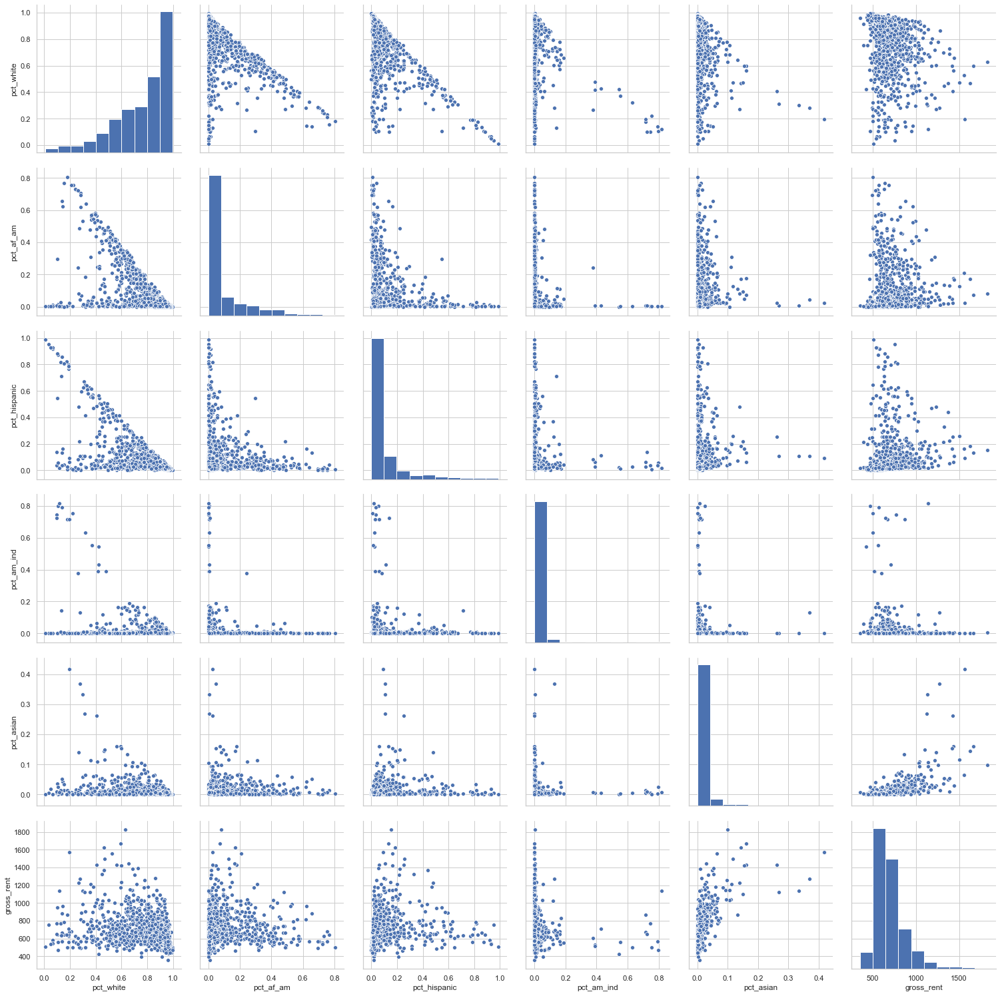

In [59]:
sns.pairplot(df_numeric_2.sample(1000),height=3.5)
plt.show()

In [60]:
df_numeric_3 = df[['pct_nh_pi','pct_multiple','pct_other','poverty_rate','pct_civilian_labor','gross_rent']]

In [61]:
df_numeric_3.head()

,pct_nh_pi,pct_multiple,pct_other,poverty_rate,pct_civilian_labor,gross_rent
0,0.0,0.005935,0.000000,4.172,0.550,577
1,0.0,0.012033,0.000000,7.714,0.545,844
2,0.0,0.014809,0.000905,9.789,0.508,700
3,0.0,0.022999,0.000000,13.735,0.545,592
4,0.0,0.016905,0.002202,8.217,0.474,444


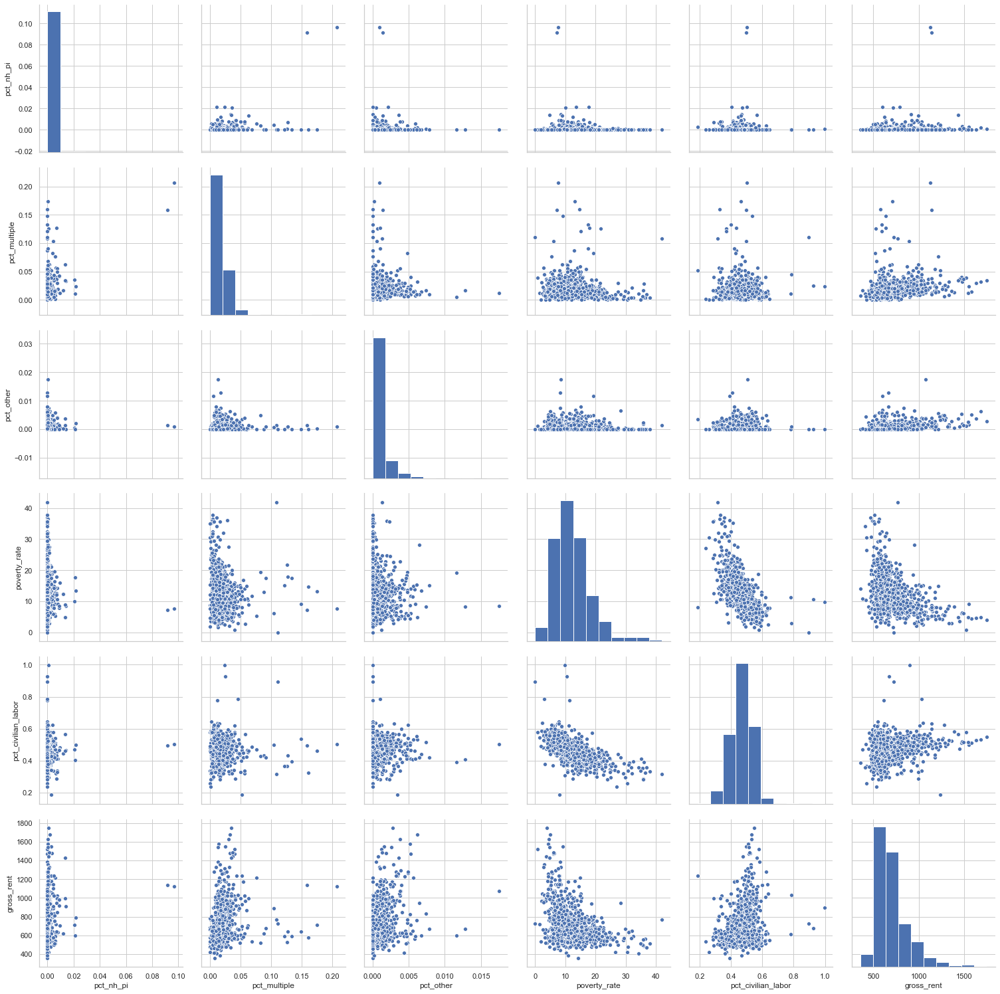

In [62]:
sns.pairplot(df_numeric_3.sample(1000),height=3.5)
plt.show()

In [63]:
df_numeric_4 = df[['pct_unemployment','pct_uninsured_adults','pct_uninsured_children','pct_adult_obesity','pct_adult_smoking','gross_rent']]

In [64]:
df_numeric_4.head()

,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,gross_rent
0,0.023,0.107,0.062,0.310,0.166,577
1,0.040,0.324,0.201,0.253,0.102,844
2,0.063,0.129,0.032,0.296,0.215,700
3,0.038,0.207,0.084,0.255,0.182,592
4,0.034,0.177,0.075,0.324,0.118,444


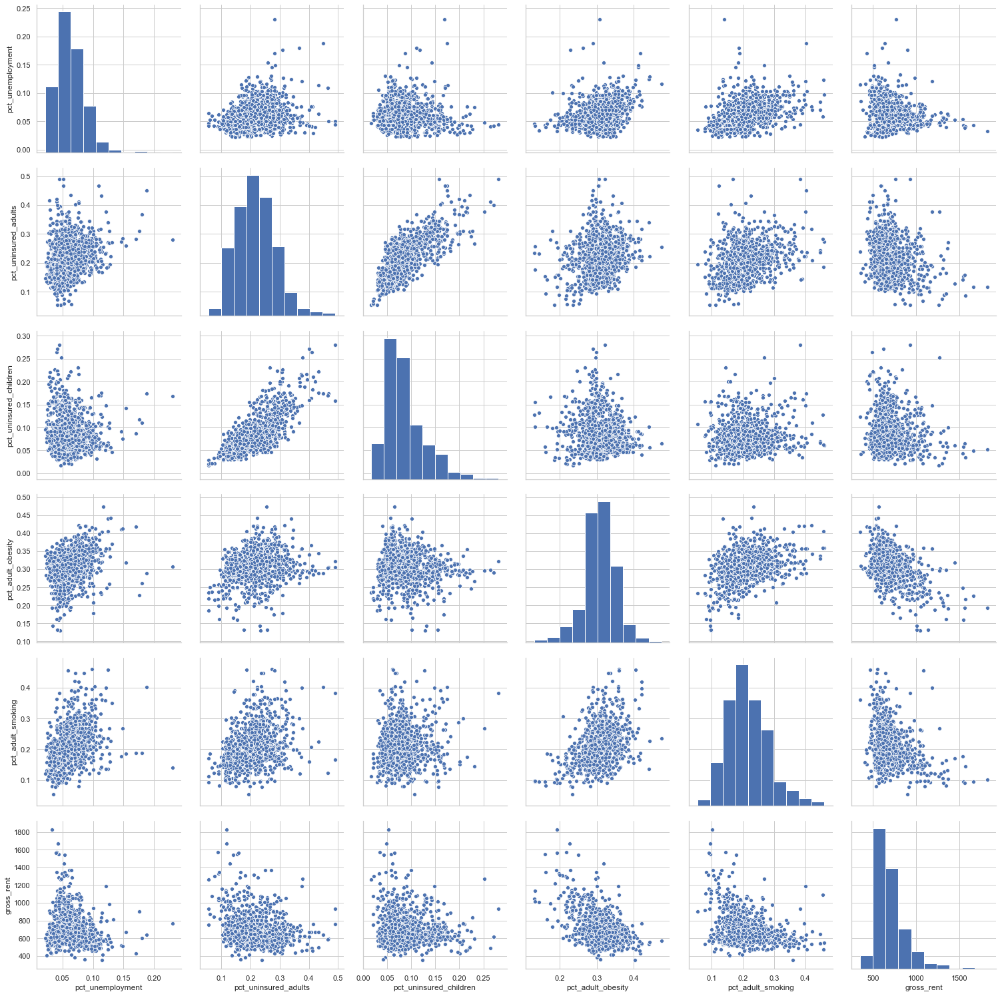

In [65]:
sns.pairplot(df_numeric_4.sample(1000),height=3.5)
plt.show()

In [66]:
df_numeric_5 = df[['pct_diabetes','pct_low_birthweight','pct_excessive_drinking','pct_physical_inactivity','air_pollution_particulate_matter_value','gross_rent']]

In [67]:
df_numeric_5.head()

,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,gross_rent
0,0.100,NaN,0.262,0.342,11.022908,577
1,0.066,0.070,0.200,0.148,9.904099,844
2,0.087,0.070,0.187,0.258,11.011502,700
3,0.104,0.081,0.169,0.274,12.845770,592
4,0.113,NaN,0.178,0.340,11.565750,444


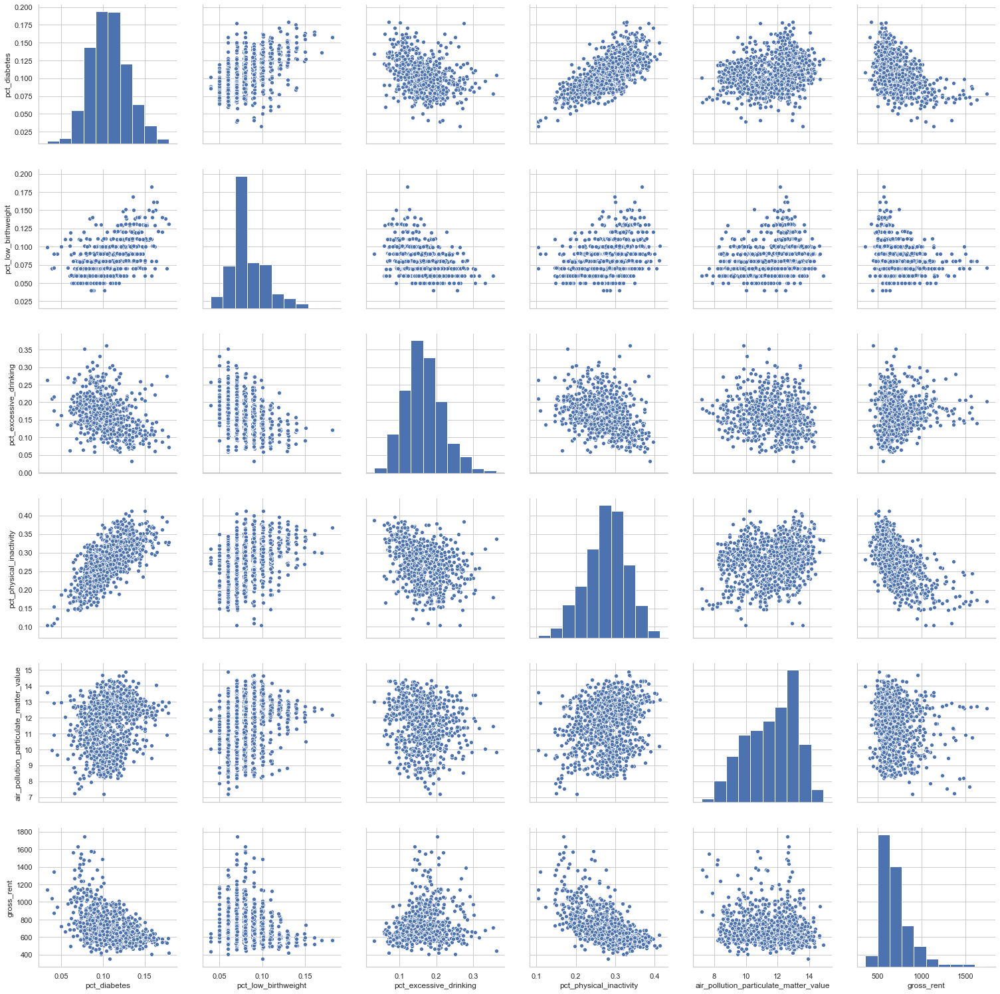

In [68]:
sns.pairplot(df_numeric_5.sample(1000),height=3.5)
plt.show()

In [69]:
df_numeric_6 = df[['homicides_per_100k','motor_vehicle_crash_deaths_per_100k','heart_disease_mortality_per_100k','pop_per_dentist','pop_per_primary_care_physician','gross_rent']]

In [70]:
df_numeric_6.head()

,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,gross_rent
0,NaN,NaN,217,NaN,NaN,577
1,NaN,18.26,181,2009.0,1690.0,844
2,NaN,19.94,234,4650.0,1350.0,700
3,NaN,30.31,231,4420.0,1749.0,592
4,NaN,NaN,270,NaN,1249.0,444


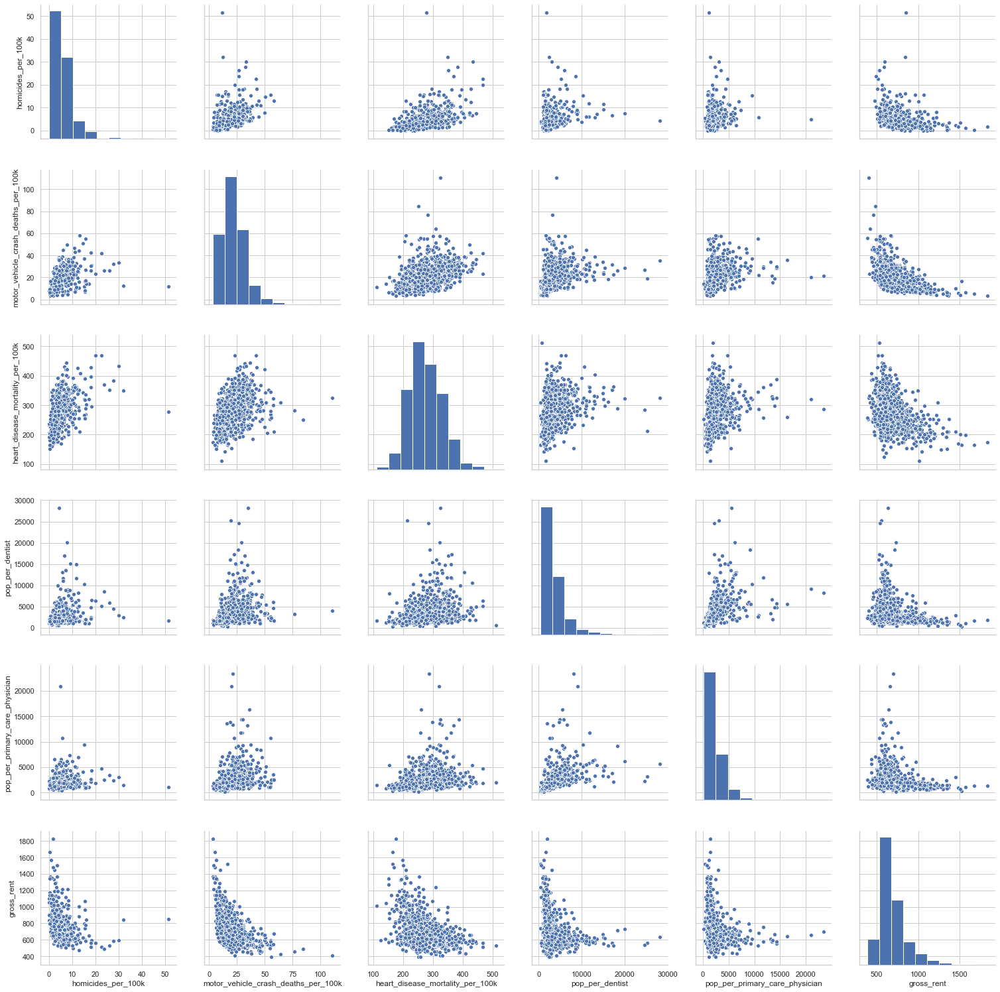

In [71]:
sns.pairplot(df_numeric_6.sample(1000),height=3.5)
plt.show()

In [72]:
df_numeric_7 = df[['pct_female','pct_below_18_years_of_age','pct_aged_65_years_and_older','pct_adults_less_than_a_high_school_diploma','pct_adults_with_high_school_diploma','gross_rent']]

In [73]:
df_numeric_7.head()

,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,gross_rent
0,0.471,0.218,0.190,0.083250,0.327984,577
1,0.472,0.290,0.077,0.099099,0.202202,844
2,0.496,0.208,0.192,0.137725,0.387226,700
3,0.503,0.193,0.215,0.077154,0.308617,592
4,0.516,0.222,0.230,0.092537,0.362189,444


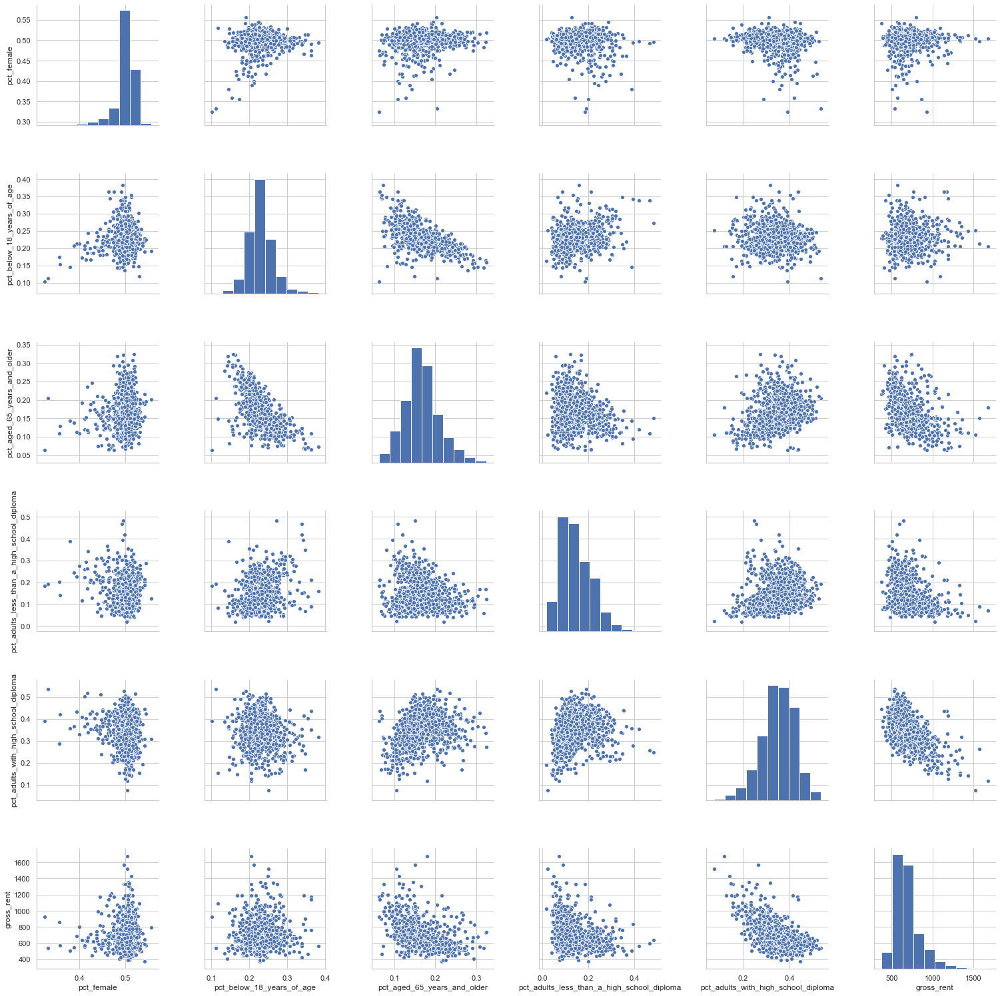

In [74]:
sns.pairplot(df_numeric_7.sample(1000),height=3.5)
plt.show()

In [75]:
df_numeric_8 = df[['pct_adults_with_some_college','pct_adults_bachelors_or_higher','birth_rate_per_1k','death_rate_per_1k','gross_rent']]

In [76]:
df_numeric_8.head()

,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k,gross_rent
0,0.389168,0.199599,10.008982,9.752342,577
1,0.302302,0.396396,14.482893,3.013219,844
2,0.255489,0.219561,9.620346,10.873572,700
3,0.398798,0.215431,9.383225,10.870809,592
4,0.346269,0.199005,9.543286,14.723926,444


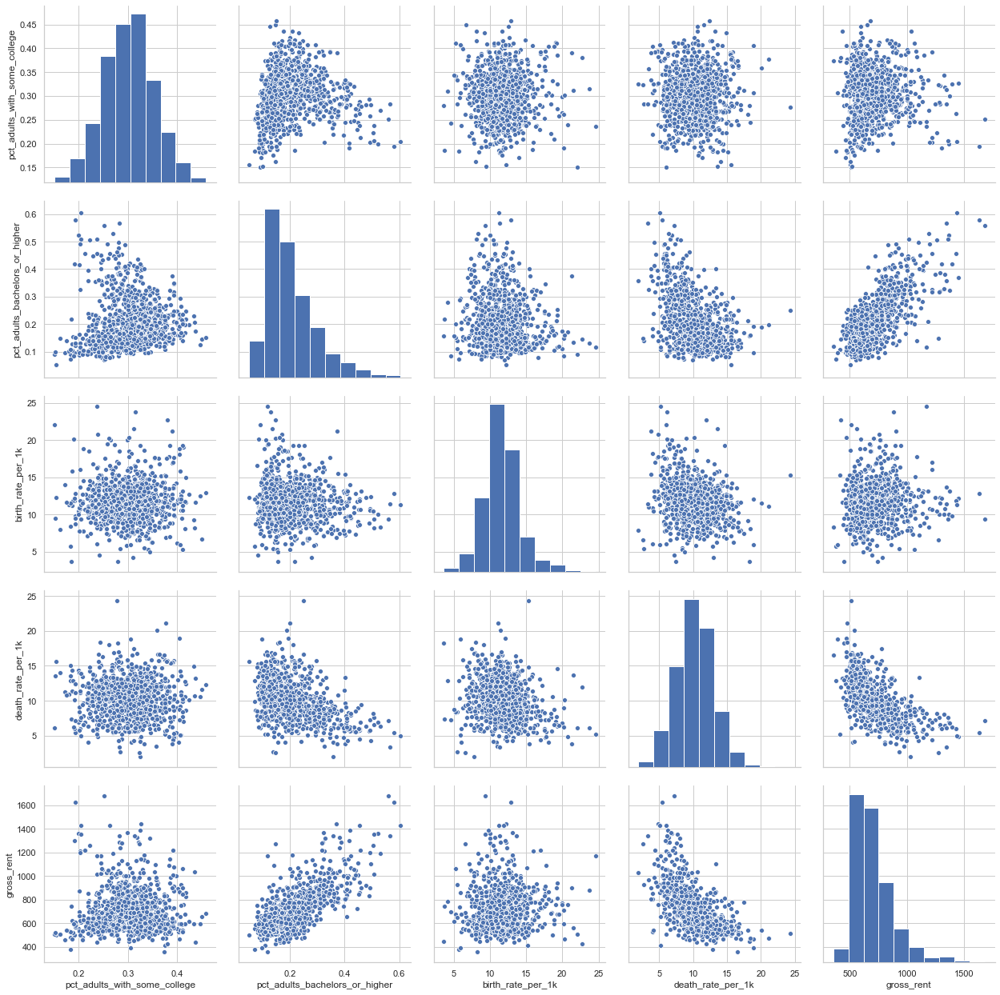

In [77]:
sns.pairplot(df_numeric_8.sample(1000),height=3.5)
plt.show()

### Explore Categorical Data

In [78]:
df_cat = df[['county_code','state','rucc','urban_influence','economic_typology','gross_rent']]

In [79]:
df_cat.head()

,county_code,state,rucc,urban_influence,economic_typology,gross_rent
0,8e686a7,fb8cab1,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to micro area and does not co...,Manufacturing-dependent,577
1,d1b5fc5,842bd12,"Nonmetro - Completely rural or less than 2,500...",Micropolitan not adjacent to a metro area,Recreation,844
2,19a463b,2b7da97,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore not adjacent to a metro/micro area and...,Recreation,700
3,1711ab7,5029ed4,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore not adjacent to a metro/micro area and...,Nonspecialized,592
4,1eb4681,b795815,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to micro area and does not co...,Farm-dependent,444


In [80]:
df['county_code'].value_counts()

3ecb3cd      1
f90b2ed      1
98fd02c      1
b7c97ba      1
327cf27      1
cf2d350      1
1e7afa6      1
190cee9      1
133ce95      1
d4ed69b      1
cca9a2e      1
bc1c51f      1
bf2311b      1
b2be407      1
6bf1dd6      1
da6731b      1
4cf55e1      1
279f041      1
1628d17      1
94e9109      1
0f97680      1
8556af5      1
2e10266      1
e68e0d2      1
8ebc0ab      1
d3e9bd7      1
867cd57      1
4ed89db      1
9122633      1
88faf13      1
b756448      1
f538006      1
e0af22c      1
d972b6d      1
0901d7a      1
a6c71df      1
fb80a2d      1
8d48f47      1
6df35c1      1
3e5b310      1
c583d8c      1
e552c19      1
ca5b6a2      1
73f8b53      1
1702648      1
ba30ffa      1
3bade44      1
d9174ba      1
cc3f24a      1
c03ba95      1
9fa113a      1
2c07bac      1
72ef953      1
db21268      1
200ef9a      1
5e41e43      1
620ffab      1
1fd951e      1
85776c0      1
d916f27      1
872c512      1
b8c4f95      1
7c450d1      1
bc9fdf7      1
dcade95      1
e6db05c      1
8e3ee2a   

In [81]:
df['county_code'].nunique()

3138

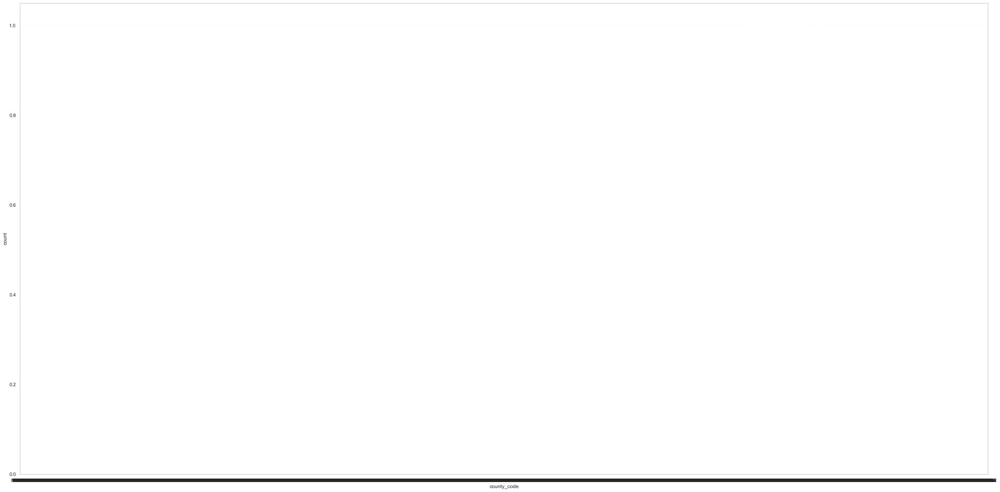

In [82]:
plt.figure(figsize=(40,20))
sns.countplot(x='county_code',data=df_cat)
plt.show()

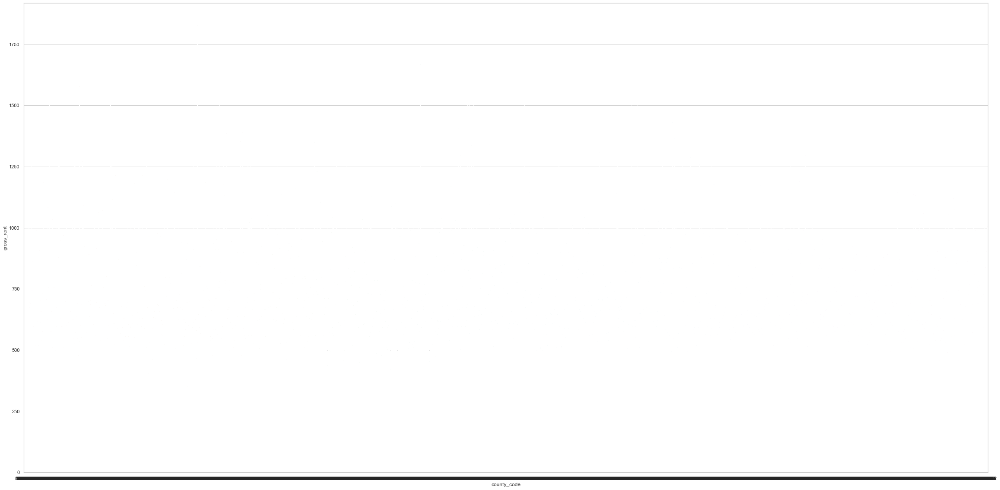

In [83]:
plt.figure(figsize=(40,20))
sns.barplot(x='county_code',y=df_cat.gross_rent,data=df_cat)
plt.show()

In [84]:
df['state'].value_counts()

1b0d913    254
4522abc    159
a952566    133
528ea9f    120
08f8fb4    115
dc9ae72    105
c479f0c    102
20d32fc    100
e2f94fa     99
9d1e27d     95
b795815     93
09d8cd0     92
158df01     88
9dda412     87
0f8930b     83
9d0874a     82
52acab4     77
9e0007d     75
e74aca3     72
e899d7f     67
7572db1     67
1646cf6     67
78e8330     65
485e9af     64
1dcfd4e     64
5086a32     62
4c72956     58
8036085     56
c3dbf0a     55
fb8cab1     53
698ab34     46
842bd12     44
3745933     39
176f5f0     36
4cd9667     33
64ffe5d     29
7dd3518     28
b44cfe6     24
5029ed4     23
bc77872     21
d233cec     16
fa605d5     16
6d287d7     15
dfc21f3     14
2b7da97     14
375d4d3     10
3337bbb      8
105e445      5
914c15f      4
9e065a4      3
a0e0eec      1
Name: state, dtype: int64

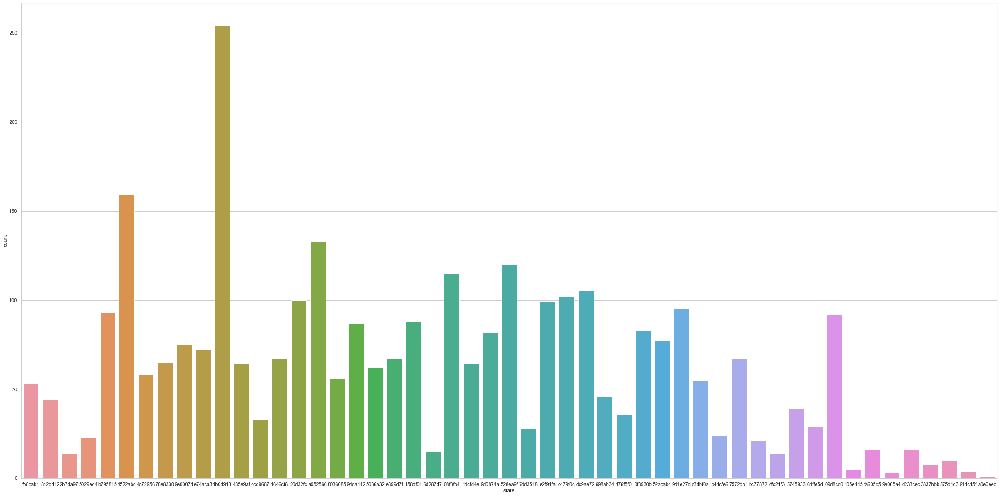

In [85]:
plt.figure(figsize=(40,20))
sns.countplot(x='state',data=df_cat)
plt.show()

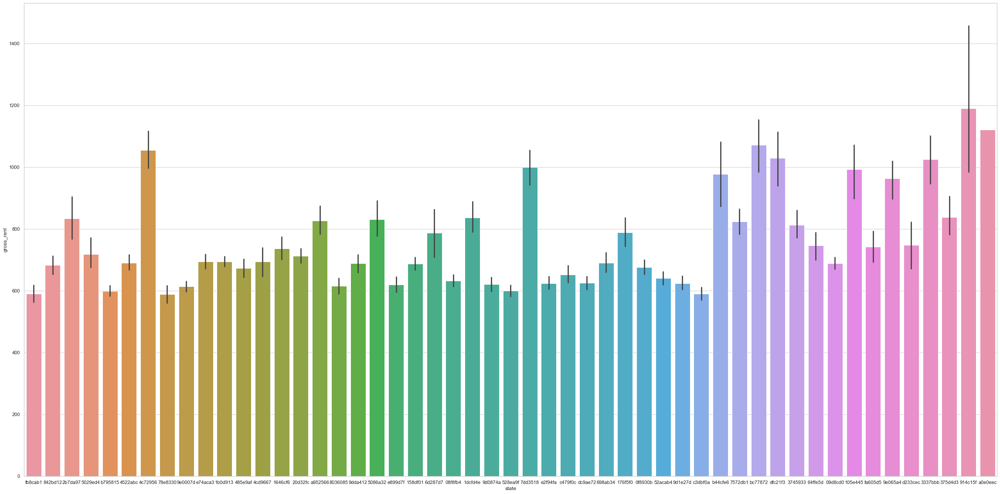

In [86]:
plt.figure(figsize=(40,20))
sns.barplot(x='state',y=df_cat.gross_rent,data=df_cat)
plt.show()

In [87]:
df['rucc'].value_counts()

Nonmetro - Urban population of 2,500 to 19,999, adjacent to a metro area                         592
Nonmetro - Urban population of 2,500 to 19,999, not adjacent to a metro area                     433
Metro - Counties in metro areas of 1 million population or more                                  432
Nonmetro - Completely rural or less than 2,500 urban population, not adjacent to a metro area    423
Metro - Counties in metro areas of 250,000 to 1 million population                               377
Metro - Counties in metro areas of fewer than 250,000 population                                 355
Nonmetro - Completely rural or less than 2,500 urban population, adjacent to a metro area        220
Nonmetro - Urban population of 20,000 or more, adjacent to a metro area                          214
Nonmetro - Urban population of 20,000 or more, not adjacent to a metro area                       92
Name: rucc, dtype: int64

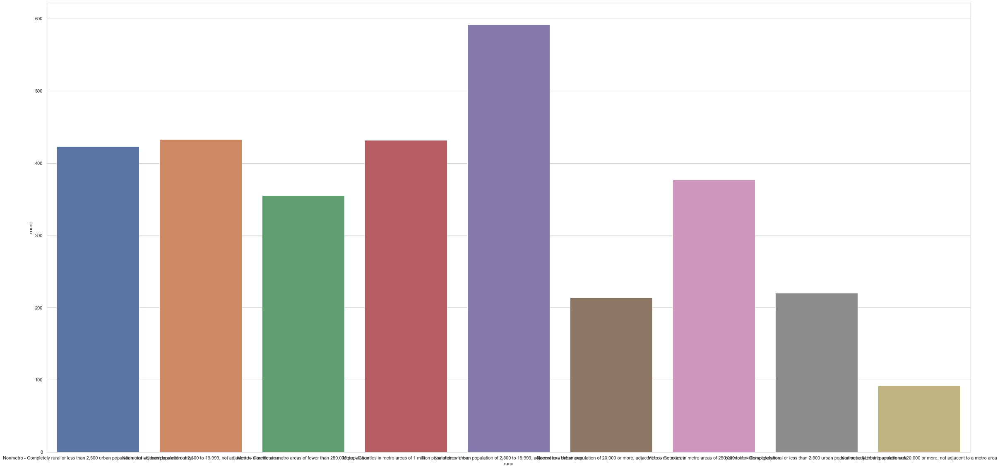

In [88]:
plt.figure(figsize=(40,20))
sns.countplot(x='rucc',data=df_cat)
plt.show()

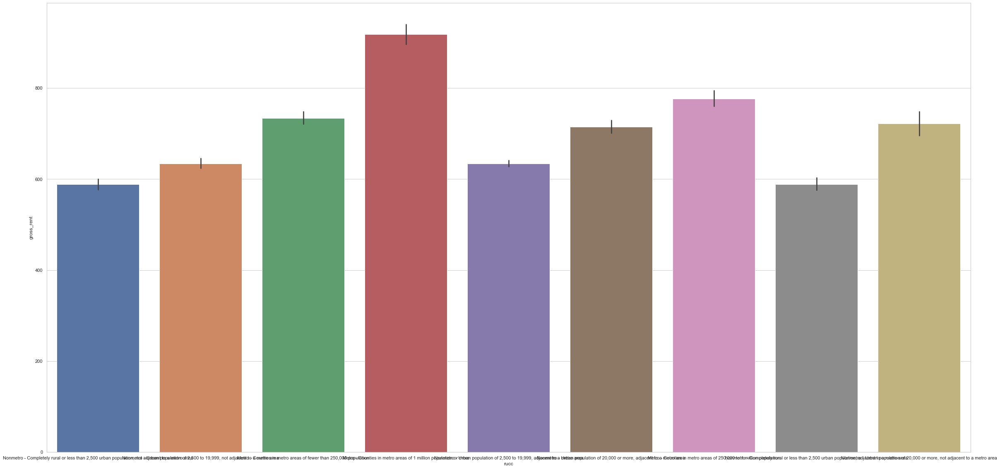

In [89]:
plt.figure(figsize=(40,20))
sns.barplot(x='rucc',y=df_cat.gross_rent,data=df_cat)
plt.show()

In [90]:
df['urban_influence'].value_counts()

Small-in a metro area with fewer than 1 million residents                                             732
Large-in a metro area with at least 1 million residents or more                                       432
Noncore adjacent to a small metro with town of at least 2,500 residents                               343
Micropolitan not adjacent to a metro area                                                             269
Micropolitan adjacent to a small metro area                                                           242
Noncore adjacent to micro area and does not contain a town of at least 2,500 residents                189
Noncore adjacent to micro area and contains a town of 2,500-19,999 residents                          184
Noncore not adjacent to a metro/micro area and does not contain a town of at least 2,500 residents    181
Noncore adjacent to a small metro and does not contain a town of at least 2,500 residents             162
Noncore adjacent to a large metro area        

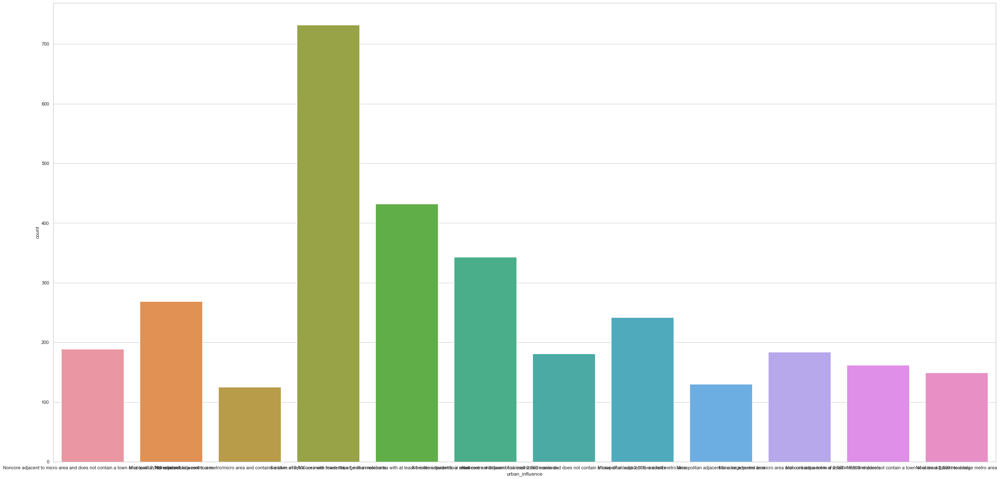

In [91]:
plt.figure(figsize=(40,20))
sns.countplot(x='urban_influence',data=df_cat)
plt.show()

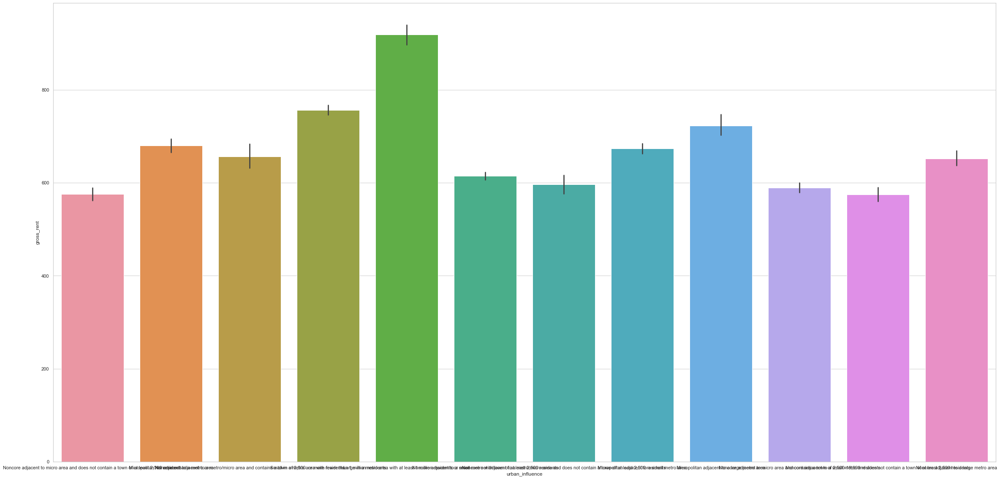

In [92]:
plt.figure(figsize=(40,20))
sns.barplot(x='urban_influence',y=df_cat.gross_rent,data=df_cat)
plt.show()

In [93]:
df['economic_typology'].value_counts()

Nonspecialized                        1234
Manufacturing-dependent                506
Farm-dependent                         444
Federal/State government-dependent     404
Recreation                             331
Mining-dependent                       219
Name: economic_typology, dtype: int64

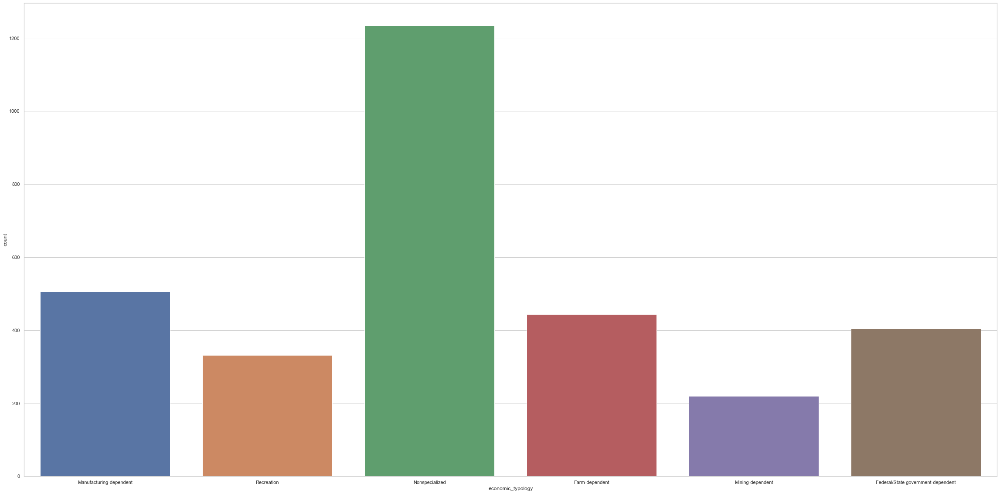

In [94]:
plt.figure(figsize=(40,20))
sns.countplot(x='economic_typology',data=df_cat)
plt.show()

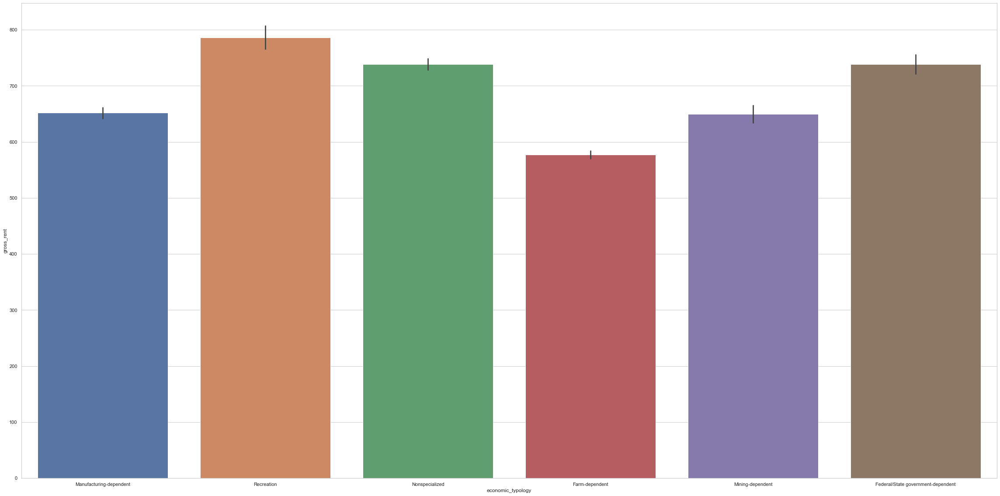

In [95]:
plt.figure(figsize=(40,20))
sns.barplot(x='economic_typology',y=df_cat.gross_rent,data=df_cat)
plt.show()

### Using Correlation

In [96]:
corrmat = df_numeric.corr()
corrmat = corrmat.abs().unstack()
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat[corrmat >= 0.5]
corrmat = corrmat[corrmat < 1]

In [97]:
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature_1','feature_2','corr_val']
corrmat.head()

,feature_1,feature_2,corr_val
0,renter_occupied_households,population,0.973266
1,population,renter_occupied_households,0.973266
2,evictions,population,0.796935
3,population,evictions,0.796935
4,evictions,renter_occupied_households,0.791052


#### Population, renter_occupied households and evictions are correlated to each other (Multicollinarity)

### Use Group By for Analysis

In [98]:
df = pd.read_csv("combinedfilled.csv")

In [99]:
df.head()

,county_code,state,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,pct_nh_pi,pct_multiple,pct_other,poverty_rate,rucc,urban_influence,economic_typology,pct_civilian_labor,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k,gross_rent
0,8e686a7,fb8cab1,3876,408,24.583,363.391914,18.380,0.945945,0.010761,0.026038,0.005685,0.005635,0.0,0.005935,0.000000,4.172,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to micro area and does not co...,Manufacturing-dependent,0.550,0.023,0.107,0.062,0.310,0.166,0.100,0.08353,0.262,0.342,11.022908,5.773744,21.546496,217,3469.825848,2564.36345,0.471,0.218,0.190,0.083250,0.327984,0.389168,0.199599,10.008982,9.752342,577
1,d1b5fc5,842bd12,10224,1166,28.346,3.000000,26.694,0.808959,0.002284,0.173426,0.001803,0.001493,0.0,0.012033,0.000000,7.714,"Nonmetro - Completely rural or less than 2,500...",Micropolitan not adjacent to a metro area,Recreation,0.545,0.040,0.324,0.201,0.253,0.102,0.066,0.07000,0.200,0.148,9.904099,5.773744,18.260000,181,2009.000000,1690.00000,0.472,0.290,0.077,0.099099,0.202202,0.302302,0.396396,14.482893,3.013219,844
2,19a463b,2b7da97,27023,2927,21.641,9.000000,31.028,0.956621,0.005141,0.013088,0.004728,0.004708,0.0,0.014809,0.000905,9.789,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore not adjacent to a metro/micro area and...,Recreation,0.508,0.063,0.129,0.032,0.296,0.215,0.087,0.07000,0.187,0.258,11.011502,5.773744,19.940000,234,4650.000000,1350.00000,0.496,0.208,0.192,0.137725,0.387226,0.255489,0.219561,9.620346,10.873572,700
3,1711ab7,5029ed4,8735,1039,23.110,0.000000,27.734,0.894835,0.000298,0.076576,0.000995,0.004297,0.0,0.022999,0.000000,13.735,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore not adjacent to a metro/micro area and...,Nonspecialized,0.545,0.038,0.207,0.084,0.255,0.182,0.104,0.08100,0.169,0.274,12.845770,5.773744,30.310000,231,4420.000000,1749.00000,0.503,0.193,0.215,0.077154,0.308617,0.398798,0.215431,9.383225,10.870809,592
4,1eb4681,b795815,3681,365,21.985,2.000000,19.673,0.923886,0.000496,0.042889,0.000000,0.013622,0.0,0.016905,0.002202,8.217,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to micro area and does not co...,Farm-dependent,0.474,0.034,0.177,0.075,0.324,0.118,0.113,0.08353,0.178,0.340,11.565750,5.773744,21.546496,270,3469.825848,1249.00000,0.516,0.222,0.230,0.092537,0.362189,0.346269,0.199005,9.543286,14.723926,444


In [100]:
df = df.drop('county_code', axis=1)

In [101]:
df.head()

,state,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,pct_nh_pi,pct_multiple,pct_other,poverty_rate,rucc,urban_influence,economic_typology,pct_civilian_labor,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k,gross_rent
0,fb8cab1,3876,408,24.583,363.391914,18.380,0.945945,0.010761,0.026038,0.005685,0.005635,0.0,0.005935,0.000000,4.172,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to micro area and does not co...,Manufacturing-dependent,0.550,0.023,0.107,0.062,0.310,0.166,0.100,0.08353,0.262,0.342,11.022908,5.773744,21.546496,217,3469.825848,2564.36345,0.471,0.218,0.190,0.083250,0.327984,0.389168,0.199599,10.008982,9.752342,577
1,842bd12,10224,1166,28.346,3.000000,26.694,0.808959,0.002284,0.173426,0.001803,0.001493,0.0,0.012033,0.000000,7.714,"Nonmetro - Completely rural or less than 2,500...",Micropolitan not adjacent to a metro area,Recreation,0.545,0.040,0.324,0.201,0.253,0.102,0.066,0.07000,0.200,0.148,9.904099,5.773744,18.260000,181,2009.000000,1690.00000,0.472,0.290,0.077,0.099099,0.202202,0.302302,0.396396,14.482893,3.013219,844
2,2b7da97,27023,2927,21.641,9.000000,31.028,0.956621,0.005141,0.013088,0.004728,0.004708,0.0,0.014809,0.000905,9.789,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore not adjacent to a metro/micro area and...,Recreation,0.508,0.063,0.129,0.032,0.296,0.215,0.087,0.07000,0.187,0.258,11.011502,5.773744,19.940000,234,4650.000000,1350.00000,0.496,0.208,0.192,0.137725,0.387226,0.255489,0.219561,9.620346,10.873572,700
3,5029ed4,8735,1039,23.110,0.000000,27.734,0.894835,0.000298,0.076576,0.000995,0.004297,0.0,0.022999,0.000000,13.735,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore not adjacent to a metro/micro area and...,Nonspecialized,0.545,0.038,0.207,0.084,0.255,0.182,0.104,0.08100,0.169,0.274,12.845770,5.773744,30.310000,231,4420.000000,1749.00000,0.503,0.193,0.215,0.077154,0.308617,0.398798,0.215431,9.383225,10.870809,592
4,b795815,3681,365,21.985,2.000000,19.673,0.923886,0.000496,0.042889,0.000000,0.013622,0.0,0.016905,0.002202,8.217,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to micro area and does not co...,Farm-dependent,0.474,0.034,0.177,0.075,0.324,0.118,0.113,0.08353,0.178,0.340,11.565750,5.773744,21.546496,270,3469.825848,1249.00000,0.516,0.222,0.230,0.092537,0.362189,0.346269,0.199005,9.543286,14.723926,444


In [102]:
df['state'].unique()

array(['fb8cab1', '842bd12', '2b7da97', '5029ed4', 'b795815', '4522abc',
       '4c72956', '78e8330', '9e0007d', 'e74aca3', '1b0d913', '485e9af',
       '4cd9667', '1646cf6', '20d32fc', 'a952566', '8036085', '9dda412',
       '5086a32', 'e899d7f', '158df01', '6d287d7', '08f8fb4', '1dcfd4e',
       '9d0874a', '528ea9f', '7dd3518', 'e2f94fa', 'c479f0c', 'dc9ae72',
       '698ab34', '176f5f0', '0f8930b', '52acab4', '9d1e27d', 'c3dbf0a',
       'b44cfe6', '7572db1', 'bc77872', 'dfc21f3', '3745933', '64ffe5d',
       '09d8cd0', '105e445', 'fa605d5', '9e065a4', 'd233cec', '3337bbb',
       '375d4d3', '914c15f', 'a0e0eec'], dtype=object)

In [103]:
df['state'].nunique()

51

In [104]:
df = df[['state','evictions','gross_rent']]

In [105]:
df.head()

,state,evictions,gross_rent
0,fb8cab1,363.391914,577
1,842bd12,3.000000,844
2,2b7da97,9.000000,700
3,5029ed4,0.000000,592
4,b795815,2.000000,444


In [106]:
group_state = df.groupby(['state'])

In [107]:
group_state.head()

,state,evictions,gross_rent
0,fb8cab1,363.391914,577
1,842bd12,3.000000,844
2,2b7da97,9.000000,700
3,5029ed4,0.000000,592
4,b795815,2.000000,444
5,4522abc,0.000000,531
6,4522abc,19.000000,976
7,4c72956,49.000000,725
8,78e8330,363.391914,533
9,9e0007d,363.391914,531


In [108]:
type(group_state)

pandas.core.groupby.generic.DataFrameGroupBy

In [109]:
group_state.get_group('fb8cab1')

,state,evictions,gross_rent
0,fb8cab1,363.391914,577
11,fb8cab1,363.391914,406
65,fb8cab1,363.391914,582
94,fb8cab1,363.391914,467
98,fb8cab1,363.391914,558
153,fb8cab1,363.391914,481
277,fb8cab1,363.391914,548
291,fb8cab1,363.391914,650
364,fb8cab1,363.391914,898
399,fb8cab1,363.391914,512


In [110]:
len(group_state.get_group('fb8cab1'))

53

In [111]:
group_state.get_group('842bd12')

,state,evictions,gross_rent
1,842bd12,3.000000,844
44,842bd12,9.000000,641
207,842bd12,0.000000,557
275,842bd12,0.000000,707
295,842bd12,9.000000,648
310,842bd12,-1.000000,733
329,842bd12,1.000000,762
346,842bd12,-1.000000,599
379,842bd12,164.000000,720
429,842bd12,27.000000,645


In [112]:
group_state.size()

state
08f8fb4    115
09d8cd0     92
0f8930b     83
105e445      5
158df01     88
1646cf6     67
176f5f0     36
1b0d913    254
1dcfd4e     64
20d32fc    100
2b7da97     14
3337bbb      8
3745933     39
375d4d3     10
4522abc    159
485e9af     64
4c72956     58
4cd9667     33
5029ed4     23
5086a32     62
528ea9f    120
52acab4     77
64ffe5d     29
698ab34     46
6d287d7     15
7572db1     67
78e8330     65
7dd3518     28
8036085     56
842bd12     44
914c15f      4
9d0874a     82
9d1e27d     95
9dda412     87
9e0007d     75
9e065a4      3
a0e0eec      1
a952566    133
b44cfe6     24
b795815     93
bc77872     21
c3dbf0a     55
c479f0c    102
d233cec     16
dc9ae72    105
dfc21f3     14
e2f94fa     99
e74aca3     72
e899d7f     67
fa605d5     16
fb8cab1     53
dtype: int64

In [113]:
group_state.count()

,evictions,gross_rent
state,,
08f8fb4,115,115
09d8cd0,92,92
0f8930b,83,83
105e445,5,5
158df01,88,88
1646cf6,67,67
176f5f0,36,36
1b0d913,254,254
1dcfd4e,64,64


In [114]:
group_state.first()

,evictions,gross_rent
state,,
08f8fb4,3.000000,523
09d8cd0,371.000000,702
0f8930b,611.000000,731
105e445,171.000000,1111
158df01,3192.000000,744
1646cf6,3434.000000,780
176f5f0,14.000000,663
1b0d913,3.000000,645
1dcfd4e,363.391914,755


In [115]:
group_state.get_group('842bd12').sum()['evictions']

2405.175740592474

In [116]:
group_state.sum()['evictions']

state
08f8fb4     26066.175741
09d8cd0     34389.743395
0f8930b     60133.959568
105e445      4535.175741
158df01     54839.391914
1646cf6     38140.000000
176f5f0      7020.175741
1b0d913    107037.636109
1dcfd4e     13245.054444
20d32fc     63219.135308
2b7da97      1144.175741
3337bbb     13470.959568
3745933     11381.094876
375d4d3      2922.567654
4522abc     69064.973579
485e9af     27349.500801
4c72956     62510.446357
4cd9667     10464.702962
5029ed4      2996.135308
5086a32     22867.716974
528ea9f     22163.014011
52acab4     20088.783827
64ffe5d      3557.000000
698ab34     21032.783827
6d287d7      9643.527222
7572db1     67369.527222
78e8330     23620.474380
7dd3518     10174.973579
8036085      2303.175741
842bd12      2405.175741
914c15f      1524.783827
9d0874a     17724.919135
9d1e27d     31098.108887
9dda412      8394.959568
9e0007d     27254.393515
9e065a4      5610.000000
a0e0eec       363.391914
a952566     55405.702962
b44cfe6      9480.054444
b795815      7925.7

In [117]:
group_state.get_group('842bd12').mean()['evictions']

54.66308501346532

In [118]:
group_state.mean()['evictions']

state
08f8fb4     226.662398
09d8cd0     373.801559
0f8930b     724.505537
105e445     907.035148
158df01     623.174908
1646cf6     569.253731
176f5f0     195.004882
1b0d913     421.408016
1dcfd4e     206.953976
20d32fc     632.191353
2b7da97      81.726839
3337bbb    1683.869946
3745933     291.822946
375d4d3     292.256765
4522abc     434.370903
485e9af     427.335950
4c72956    1077.766317
4cd9667     317.112211
5029ed4     130.266753
5086a32     368.834145
528ea9f     184.691783
52acab4     260.893296
64ffe5d     122.655172
698ab34     457.234431
6d287d7     642.901815
7572db1    1005.515332
78e8330     363.391914
7dd3518     363.391914
8036085      41.128138
842bd12      54.663085
914c15f     381.195957
9d0874a     216.157550
9d1e27d     327.348515
9dda412      96.493788
9e0007d     363.391914
9e065a4    1870.000000
a0e0eec     363.391914
a952566     416.584233
b44cfe6     395.002268
b795815      85.223047
bc77872     621.428571
c3dbf0a     163.286979
c479f0c     330.338502
d233c

In [119]:
group_state.min()

,evictions,gross_rent
state,,
08f8fb4,-1.000000,406
09d8cd0,-1.000000,533
0f8930b,-1.000000,411
105e445,171.000000,835
158df01,6.000000,533
1646cf6,3.000000,475
176f5f0,-1.000000,563
1b0d913,-1.000000,433
1dcfd4e,-1.000000,498


In [120]:
group_state.max()

,evictions,gross_rent
state,,
08f8fb4,5690.000000,996
09d8cd0,13590.000000,1038
0f8930b,12630.000000,1143
105e445,3274.000000,1111
158df01,7869.000000,1110
1646cf6,11181.000000,1197
176f5f0,1695.000000,1189
1b0d913,29251.000000,1194
1dcfd4e,3729.000000,1344
